Import plot and numerical dependencies

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
import plotly.graph_objects as go
from plotly.graph_objs import Scatter

Let's start by defining a functions for generating a wave, and use it to plot a wave of period 10 with 520 samples and amplitude 1.

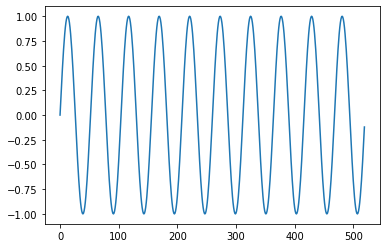

In [2]:
def wave(frequency, resolution, amplitude, fn=np.sin):
    length = np.pi * 2 * frequency
    my_wave = fn(np.arange(0, length, length / resolution))
    return my_wave * amplitude

series = wave(10, 520, 1)
plt.plot(series)
plt.show()

Define some plot functions. One uses matplotlib, while the other uses plotly. Plotly is better when you want to interact to better analize the graphic.

In [3]:
def plot(series: list, labels: list, show=True, ax = None, title = ''):
    if ax == None:
        plt.figure(figsize = (15, 6))
    for i, s in enumerate(series):
        module, title_fn = (plt, plt.title) if ax == None else (ax, ax.set_title)
        title_fn(title)
        module.plot(s, label=labels[i])
    if show:
        plt.legend(bbox_to_anchor =(1.25, 1))
        plt.show()
        
def plot_px(series: list, labels: list, title = ''):
    fig = go.Figure(layout_title_text=title)
    for i, data in enumerate(series):
        data = pd.Series(data)
        fig = fig.add_trace(Scatter(x = data.index, y = data, mode='lines', name=f'{labels[i]}'))
    fig.show()

Instatiate a scaler and fit it to the series. It is better to scale the series, as performs better with values between 0 and 1.

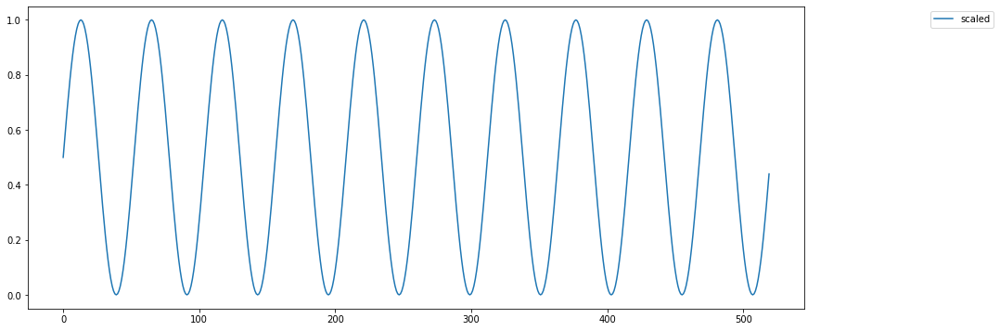

In [4]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
scaler = MinMaxScaler()
scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
plot([scaled_series], ['scaled'])

We need to prepare the dataset to train the model. Let's start by trying to forecast the value of time `t` by feeding the value at time `t - 1`.

The previous values at time `t - n` are named *lags*. Here we are using 1 lag,

In [5]:
def prepare_lags(series: np.array, lags: int):
    range_right = lags + 1
    series_df = pd.Series(series)
    lagged_series = {f'y - {range_right - i}':series_df.shift(range_right - i) for i in range(1, range_right)}
    lagged_series_df = pd.DataFrame(lagged_series)
    lagged_series_df['y'] = series
    lagged_series_df = lagged_series_df.dropna()
    
    return lagged_series_df

lagged_series_df = prepare_lags(scaled_series, lags=1)
lagged_series_df.head(10)

,y - 1,y
1,0.500000,0.560268
2,0.560268,0.619658
3,0.619658,0.677302
4,0.677302,0.732362
5,0.732362,0.784032
6,0.784032,0.831561
7,0.831561,0.874255
8,0.874255,0.911492
9,0.911492,0.942728
10,0.942728,0.967508


Split our dataset into train and test sets. We use the 60% for train and 40% for test.

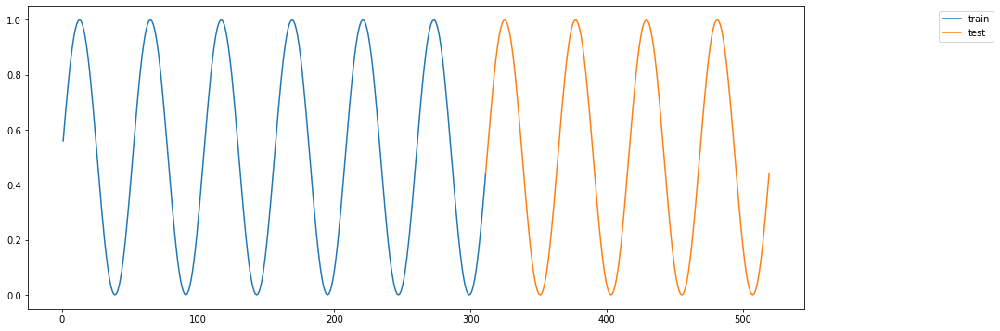

In [6]:
def split_test(series_df: pd.DataFrame, split_percentage: float):
    train_len = int(len(series_df) * split_percentage)
    train_df = series_df.loc[:train_len]
    test_df = series_df.loc[train_len:]
    
    return train_df.values[:, :-1], train_df.values[:, -1], test_df.values[:, :-1], test_df.values[:, -1], train_df, test_df

X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)
plot([train_df['y'], test_df['y']], labels=['train', 'test'])

Let's now import from tensorflow and keras, what we need for neural networks training.

In [7]:
import tensorflow as tf
tf.debugging.set_log_device_placement(False)
tf.config.set_visible_devices([], 'GPU')

from tensorflow import keras
from keras import layers, activations, optimizers
from keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error
import math

We are going to train the model using **Adam** gradient descent optimizer, and **mean squared error** as the function to measure the training error. We are going to train with a **batch size of 32** and a maximum of **200 epochs**. Epochs are **early stopped**, if no further improvement is observed for 30 consecutive epochs.

Once the model is trained, we will test it trying to predict the test values, one value at time. 

We will evaluate the quality of the model by measuring the **root mean squared error** between the actual test values and the predicted values.
We train the models 5 times each, in order to deal with the randomness of the training. Then we also take as second parameter of quality, the **standard deviation of the error**. This gives us a measure of the stability of the model.

As we scales values between 0 and 1 for training, we have to unscale before comparing them to the test values.

Let's define some helper functions in order to conduct the experiments.

In [11]:
def root_mean_squared_error(y, y_pred):
    return math.sqrt(mean_squared_error(y, y_pred))

def evaluate(y_test, forecast, show=True, ax=None):
    error = root_mean_squared_error(y_test, forecast)
    plot([y_test, forecast], ['actual', 'predicted'], show=show, ax=ax, title=f'error: {error}')
    
def unscale(series: np.array, scaler: MinMaxScaler):
    return scaler.inverse_transform(series.reshape(-1, 1)).reshape(-1)
    
def run_model(
    model_layers: list, 
    X_train: np.array, 
    y_train: np.array, 
    X_test: np.array, 
    y_test: np.array, 
    epochs:int,
    batch_size=32, 
    name='',
    early_stop=True,
    learning_rate=0.001,
    verbose=True
    ):
    
    early_stop_cb = EarlyStopping(
        monitor = 'val_loss', min_delta = 0.0001,
        patience = 30, mode = 'min', verbose = verbose,
        restore_best_weights = True)
    
    model = keras.models.clone_model(keras.Sequential(model_layers, name=name))
    model.compile(optimizer=optimizers.Adam(learning_rate = learning_rate), loss='mean_squared_error')

    history = model.fit(
        X_train, 
        y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=False,
        callbacks=[early_stop_cb] if early_stop else []
        )

    forecast = model.predict(X_test, verbose=verbose)    
    return forecast, history, model

def evaluate_model(
    run_times: int,
    model_layers: list, 
    X_train: np.array, 
    y_train: np.array, 
    X_test: np.array, 
    y_test: np.array, 
    epochs:int,
    scaler: MinMaxScaler,
    batch_size=32,
    name='',
    early_stop=True, 
    learning_rate=0.001,
    verbose=True,
    print_plot=True,
    print_summary=True
    ):
    
    errors = []
    forecasts = []
    models = []
    histories = []
    y_test_unscaled = unscale(y_test, scaler)
    
    for _ in range(run_times):
        forecast, history, model = run_model(
            model_layers, 
            X_train, y_train, X_test, y_test,
            epochs=epochs, 
            batch_size=batch_size,
            name=name,
            early_stop=early_stop,
            learning_rate=learning_rate,
            verbose=verbose
        )

        forecast = unscale(forecast, scaler)
        error = root_mean_squared_error(y_test_unscaled, forecast)
        errors.append(error)
        forecasts.append(forecast)
        models.append(model)
        histories.append(history)
        
    error_avg = np.array(errors).mean()
    error_std = np.array(errors).std()
    if print_summary:        
        models[0].summary()
        print(f'errors: {errors}')
        print(f'error avg: {error_avg}')    
        print(f'error std: {error_std}')
    
    if print_plot:
        _, ax = plt.subplots(1, len(histories), figsize=(25,6))
        for i, history in enumerate(histories):
            plot([history.history['loss'], history.history['val_loss']], labels=['loss', 'val_loss'], ax=ax[i], show=False)
        plt.legend(bbox_to_anchor =(1.25, 1))
        plt.show()
            
        plot([y_test_unscaled] + forecasts, ['actual'] + [f'prediction_{i}' for i in range(len(forecast))])
        plot_px([y_test_unscaled] + forecasts, ['actual'] + [f'prediction_{i}' for i in range(len(forecast))])
    
    return { name: (errors, error_avg, error_std) }

def baseline(test_series):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(test_series, [test_series.mean()] * len(test_series), show=False, ax=ax[0])
    evaluate(test_series[1:], pd.DataFrame(test_series).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()

Before starting with the experiments, let's define two **naives baseline models**, to compare: 
 1. the average value of the test set
 2. the same series shifted by 1 time period (i.e. the forecasted value of time `t` is the series value at time `t-1`)

Our NN models will have to perform better then these two.

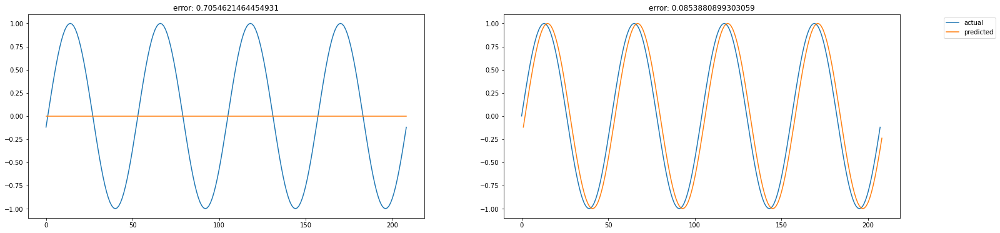

In [9]:
y_test_unscaled = unscale(y_test, scaler)
baseline(y_test_unscaled)

We will start from evaluating how a simple Multi layer perceptron is good in fitting this function, feeding it with one lag.
We define only one hidden layer with 5 neurons.

Model: "Simple_MLP_1_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_83 (Dense)            (None, 5)                 10        
                                                                 
 dense_84 (Dense)            (None, 1)                 6         
                                                                 
Total params: 16
Trainable params: 16
Non-trainable params: 0
_________________________________________________________________
errors: [0.08601206274883057, 0.09021151223995157, 0.08770447735295835, 0.08728964832762327, 0.08630770745617761]
error avg: 0.08750508162510827
error std: 0.0014882034202524273


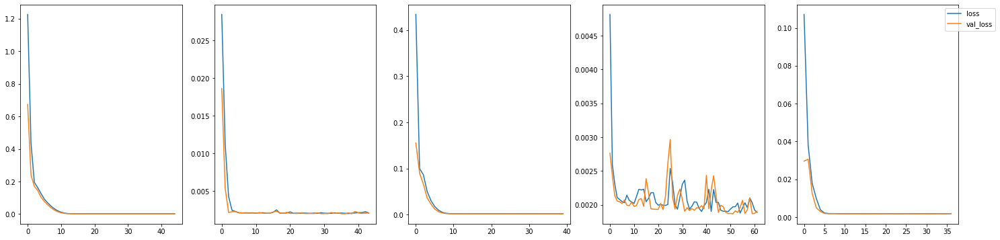

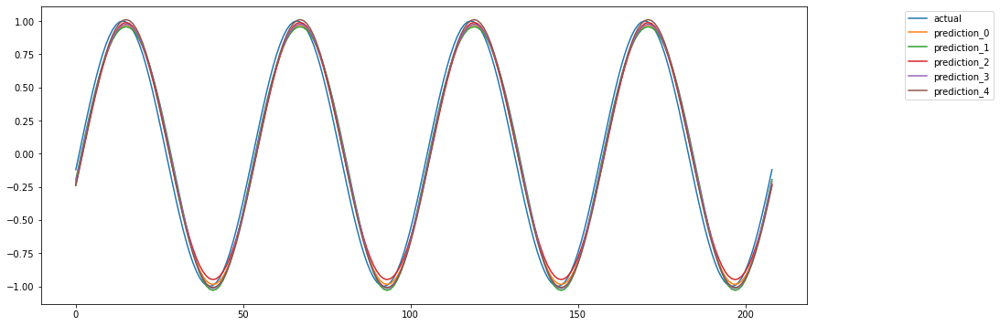

In [69]:

lags = 1
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags1_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=100,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

The result is not that good. The result looks similar to the shifted baseline model.

Let's try to emprove it by adding one more lag to the input.

In [10]:
lags=2
lagged_series_df = prepare_lags(scaled_series, lags=lags)
lagged_series_df.head(10)

,y - 2,y - 1,y
2,0.500000,0.560268,0.619658
3,0.560268,0.619658,0.677302
4,0.619658,0.677302,0.732362
5,0.677302,0.732362,0.784032
6,0.732362,0.784032,0.831561
7,0.784032,0.831561,0.874255
8,0.831561,0.874255,0.911492
9,0.874255,0.911492,0.942728
10,0.911492,0.942728,0.967508
11,0.942728,0.967508,0.985471


Model: "Simple_MLP_2_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_85 (Dense)            (None, 5)                 15        
                                                                 
 dense_86 (Dense)            (None, 1)                 6         
                                                                 
Total params: 21
Trainable params: 21
Non-trainable params: 0
_________________________________________________________________
errors: [0.01426418462828221, 0.007324755636849151, 0.014558986655531847, 0.020082806147414523, 0.01887337519183542]
error avg: 0.01502082165198263
error std: 0.004482880303293823


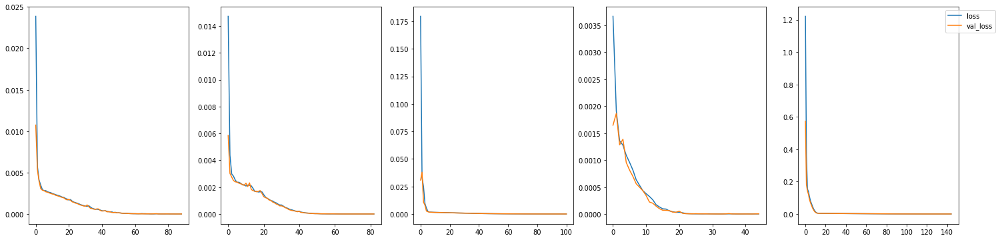

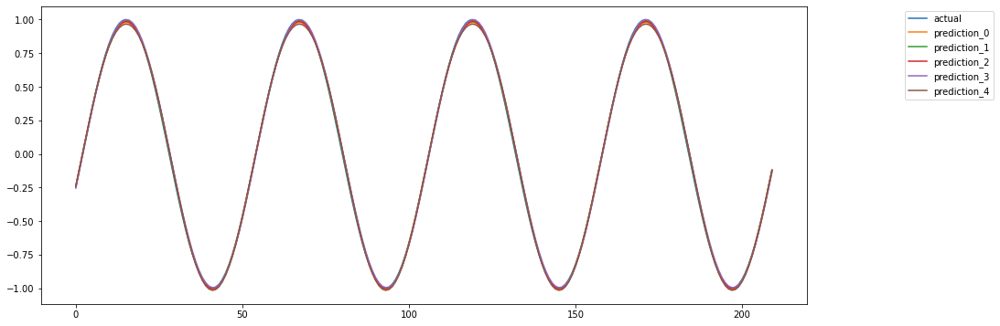

In [71]:
lags = 2
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags2_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,    
    verbose=False,
    print_summary=True
)

Now the model is able to learn the function with a very low error.

We have evidence that feeding more lags is the right path. 

But what if we add some **noise** to the sinusoid?

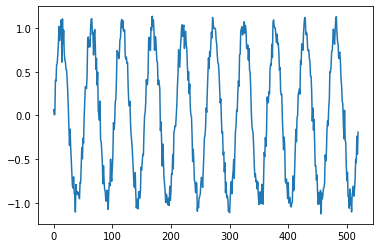

In [12]:
def noise(resolution, std, amplitude = 1):
    return np.random.normal(0, std, resolution) * amplitude

resolution = 520
noisy_sin_series = wave(10, resolution, 1) + noise(resolution, 0.1)
plt.plot(noisy_sin_series)
plt.show()

We added a pure random noise with a 0.1 std value. We **can't expect our model having an error value lower than 0.1**, but it must be as close as possible.

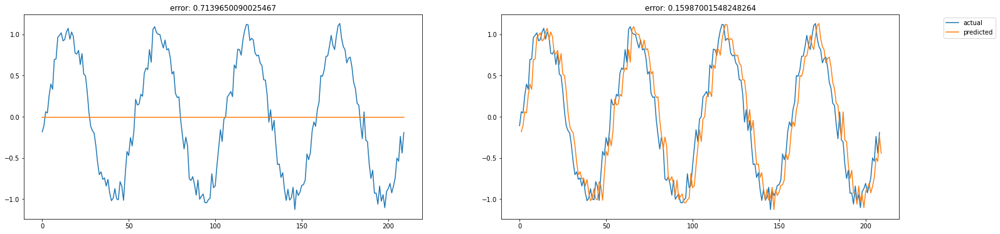

In [13]:
lags = 2
scaled_series = scaler.fit_transform(noisy_sin_series.reshape(-1, 1)).reshape(-1)
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

y_test_unscaled = unscale(y_test, scaler)
baseline(y_test_unscaled)

Model: "Simple_MLP_3_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_89 (Dense)            (None, 5)                 20        
                                                                 
 dense_90 (Dense)            (None, 1)                 6         
                                                                 
Total params: 26
Trainable params: 26
Non-trainable params: 0
_________________________________________________________________
errors: [0.1549413372141053, 0.15487437113518523, 0.15576992482975435, 0.15662615833649127, 0.15726985249333836]
error avg: 0.1558963288017749
error std: 0.0009371875852777909


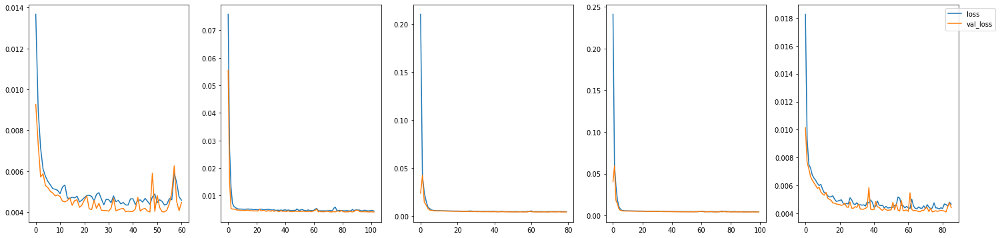

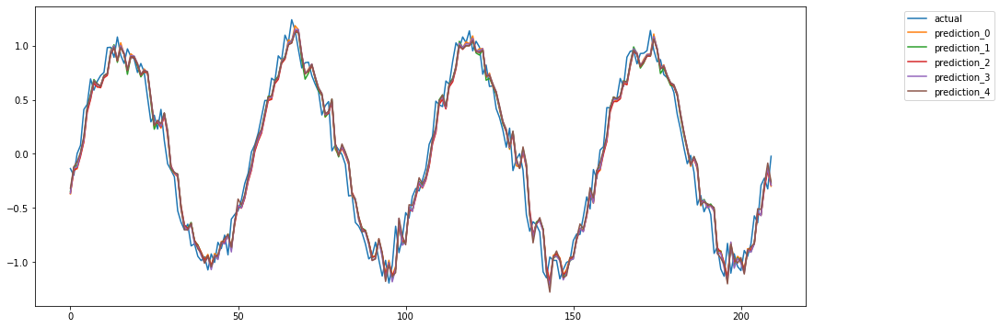

In [75]:
lags2_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

The model is stable but does not perform any better than the baseline model. Adding noise, reintroduced the shifting problem. That means that the model in not anymore able to discover the underlying sinusoidal pattern.
Let's try to add more lags.

Model: "Simple_MLP_4_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_91 (Dense)            (None, 5)                 25        
                                                                 
 dense_92 (Dense)            (None, 1)                 6         
                                                                 
Total params: 31
Trainable params: 31
Non-trainable params: 0
_________________________________________________________________
errors: [0.14525927177962203, 0.14887167406110133, 0.14552081265956174, 0.14501371900713175, 0.14703016130521002]
error avg: 0.14633912776252536
error std: 0.0014480162313987132


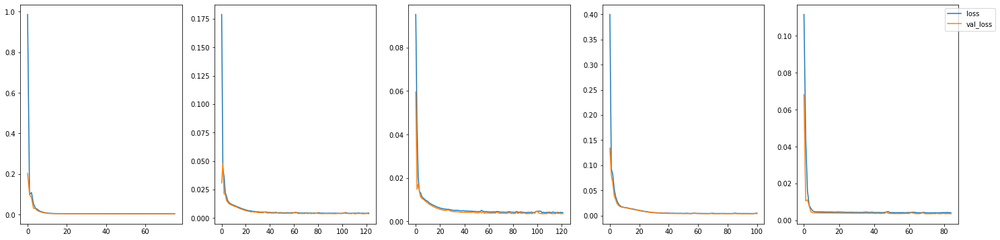

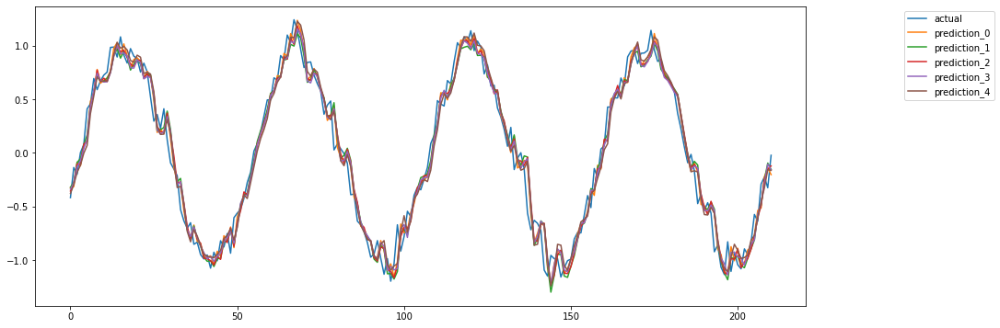

In [76]:
lags=4
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags4_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

Now the model is performs better than the baselines, but the average is not that good. Let's see if we are able to improve it by adding more hidden layers.

Model: "MLP_4_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_93 (Dense)            (None, 10)                50        
                                                                 
 dense_94 (Dense)            (None, 100)               1100      
                                                                 
 dense_95 (Dense)            (None, 10)                1010      
                                                                 
 dense_96 (Dense)            (None, 1)                 11        
                                                                 
Total params: 2,171
Trainable params: 2,171
Non-trainable params: 0
_________________________________________________________________
errors: [0.14074643509275025, 0.14323399790069122, 0.143832576449154, 0.141588063954037, 0.14320277069473908]
error avg: 0.1425207688182743
error std: 0.0011586940991689693


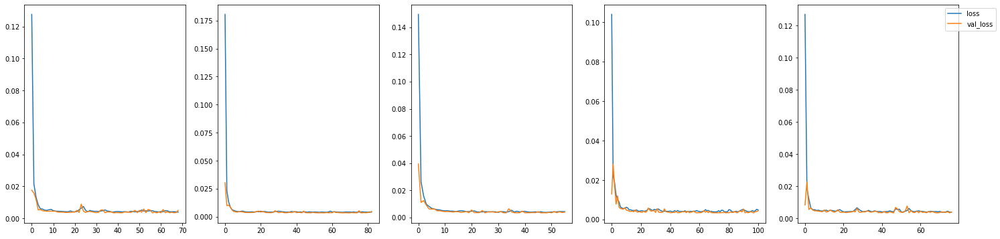

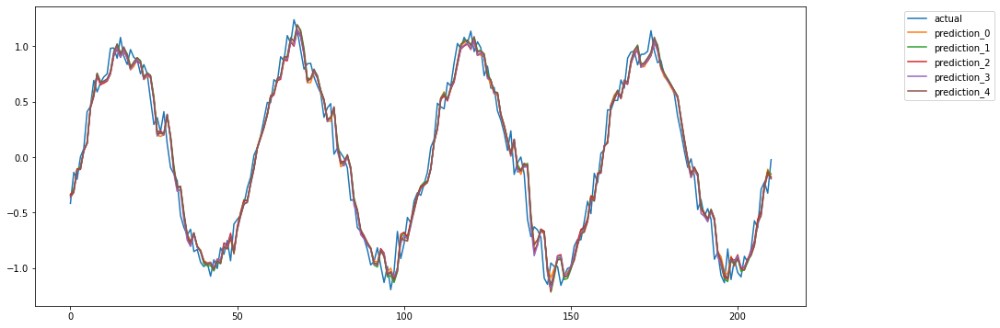

In [77]:
lags4_results_noise_MLP = evaluate_model(
    5,
    [
        layers.Dense(10, activation=activations.elu),
        layers.Dense(100, activation=activations.elu),
        layers.Dense(10, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

We can observe a little improvement but nothing actually satisfying.

What if we introduce more sophisticated models like **Recurrent Neural Networks** and **Convolutional Neural Networks**?

In [14]:
def evaluate_all_models(X_train, y_train, X_test, y_test, scaler, verbose=False, plot=True, print_summary=True, first_hidden_num=10):
    lags = X_train.shape[1]
    result = {}

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Simple_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dropout(0.1),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1),
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(20, activation=activations.elu, return_sequences=True),
            layers.SimpleRNN(10, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.LSTM(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'LSTM_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.GRU(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'GRU_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv1D(64, kernel_size=math.ceil(lags / 2.), activation=activations.elu),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv1D(64, kernel_size=math.ceil(lags / 2.), activation=activations.elu),
            layers.Flatten(),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result2 = np.array([[k, v[1], v[2]] for k,v in zip(result.keys(), result.values())])
    return pd.DataFrame({'avg': result2[:, 1], 'std': result2[:, 2]}, index = result2[:, 0])

In [79]:
result_4_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
result_4_lags_all_models

,avg,std
Simple_MLP_4_lags,0.14580454175350002,0.000871079981221499
Deep_MLP_4_lags,0.14364394511834694,0.0011680301506287758
Deep_MLP_Dropout_4_lags,0.14343801672572037,0.0015722705531981253
RNN_4_lags,0.14476382053678324,0.0016615730824767465
RNN_RNN_4_lags,0.1423692107929436,0.00064750848938919
LSTM_4_lags,0.14747303926733052,0.0010940982976280515
GRU_4_lags,0.14617108655987504,0.001502525709011646
CNN_Dropout_4_lags,0.14637081099892096,0.0013768864679346137
CNN_4_lags,0.1446127460501092,0.0006832063537736678


We can observe that neither the RNN models nor the CNN models actually improve the prediction. The deep MLP is still the best performer. We can observe that CNN is more stable with a Droupout level after .

In [80]:
result_4_lags_all_models_20hidden = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
result_4_lags_all_models_20hidden

,avg,std
Simple_MLP_4_lags,0.14545995679468424,0.0006505326402180957
Deep_MLP_4_lags,0.14370004875090098,0.0007185570938046688
Deep_MLP_Dropout_4_lags,0.14371183145498095,0.0010208406555174754
RNN_4_lags,0.14499884730643858,0.0019781823086092716
RNN_RNN_4_lags,0.1448486694617923,0.0011877048892101104
LSTM_4_lags,0.14671956200573505,0.0011858278335226376
GRU_4_lags,0.14593750501581143,0.0013418557754171637
CNN_Dropout_4_lags,0.1466034975108208,0.0009150266334148064
CNN_4_lags,0.1456740773728748,0.0004153956749663449


We don't observe any significant improvement by highering the number of the hidden layers. But what happens if we higher again the number of lags?

In [15]:
def fft(series):
    n = len(series)
    fft = np.fft.fft(series, n)
    PSD = fft * np.conj(fft) / n
    
    return PSD.real

def new_series(series, scaler, lags=10):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    ax[0].plot(series)
    ax[0].set_title('series')
    ax[1].plot(fft(series))
    ax[1].set_title('fourier components')
    plt.show()

    scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
    lagged_series_df = prepare_lags(scaled_series, lags=lags)
    X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

    y_test_unscaled = unscale(y_test, scaler)
    
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(y_test_unscaled, [y_test_unscaled.mean()] * len(y_test_unscaled), show=False, ax=ax[0])
    evaluate(y_test_unscaled[1:], pd.DataFrame(y_test_unscaled).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()
    
    return series, X_train, y_train, X_test, y_test, lagged_series_df

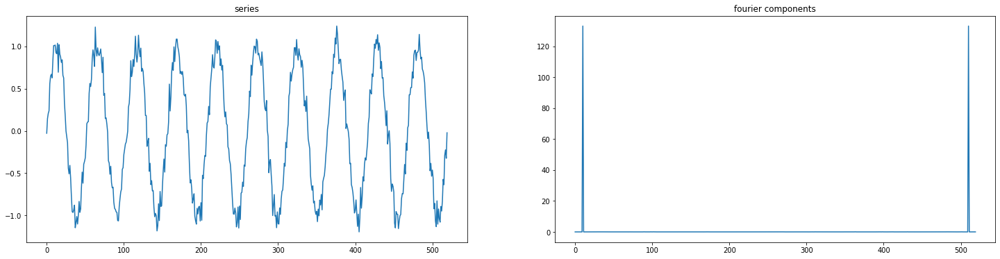

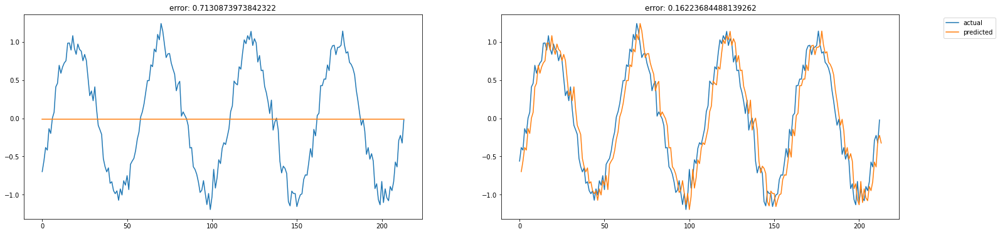

,avg,std
Simple_MLP_10_lags,0.12223640317741284,0.0018855066144182503
Deep_MLP_10_lags,0.12304845421646253,0.0014059750587172453
Deep_MLP_Dropout_10_lags,0.12212942677775436,0.0027180342861384673
RNN_10_lags,0.12303451140809296,0.0016313500047517742
RNN_RNN_10_lags,0.12138192410655266,0.001801452322993662
LSTM_10_lags,0.12188190321018433,0.0015866160446434535
GRU_10_lags,0.1212956702234849,0.0005887786196435132
CNN_Dropout_10_lags,0.12236726699345273,0.0005266142482302839
CNN_10_lags,0.12250721725632721,0.0009446218097481592


In [82]:
lags=10
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
result_10_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
result_10_lags_all_models

Now we observe a significant improvement in all of the models. In case of a CNNs go very close to the target value of 0.1. With 10 lags, all the networks are very good in discovering the underlying pattern.

Let's try to higher the lags one more time to 20. Together we also higher to 20 the number of hidden layers.

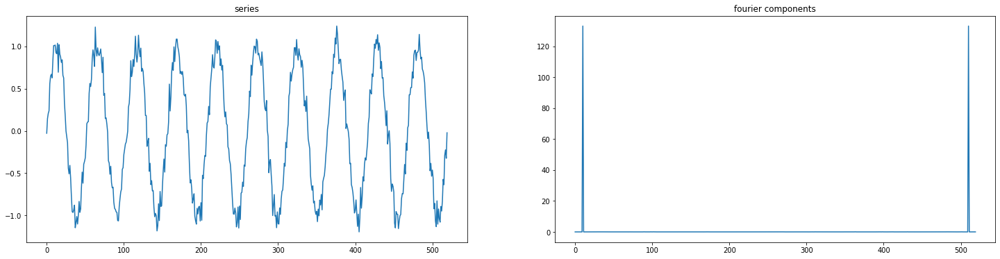

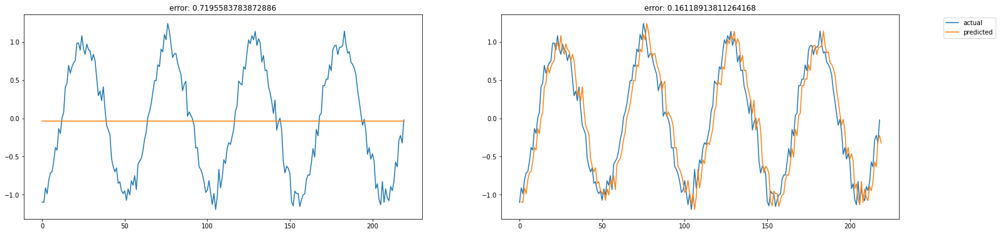

,avg,std
Simple_MLP_20_lags,0.12007022994541243,0.0015838214179108273
Deep_MLP_20_lags,0.11755302902510556,0.002207711689610495
Deep_MLP_Dropout_20_lags,0.11855727108845844,0.0013175830531174052
RNN_20_lags,0.11624134691503969,0.0034315744323429455
RNN_RNN_20_lags,0.11990475105045409,0.0038336090473598317
LSTM_20_lags,0.11151175118482545,0.0011695772249604567
GRU_20_lags,0.11142379206720346,0.0009402115463732829
CNN_Dropout_20_lags,0.12044455024887253,0.004483187832355065
CNN_20_lags,0.11855292861287652,0.0009635258607085537


In [83]:
lags=20
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
result_20_lags_all_models

Even better for all the models, even if it look like the CNN with dropout got a little unstable.

What if the signal changes in time? Let's observe the models behavior on a fading wave

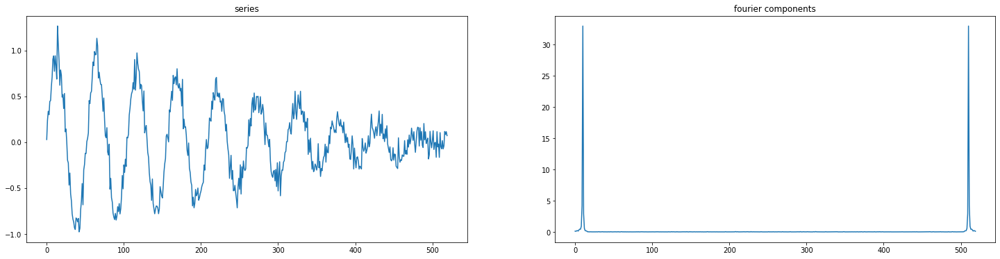

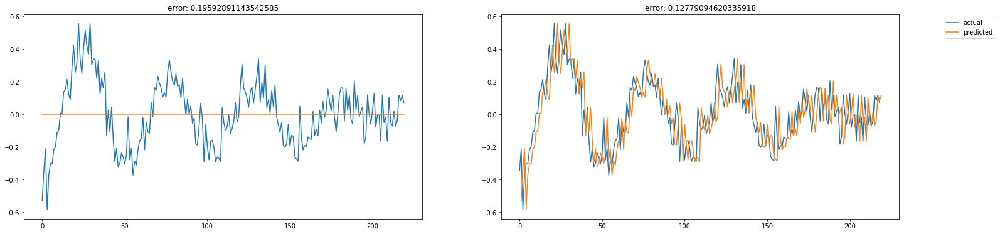

In [16]:
def fading_wave(frequency, resolution, amplitude, fn=np.sin, reverse=True):
    my_wave = wave(frequency, resolution, amplitude, fn)
    fading_amplitude = np.linspace(0, 1, resolution)
    if(reverse):
        fading_amplitude = np.flip(fading_amplitude)
    return my_wave * fading_amplitude

lags=20
resolution = 520
fading_series_noise1, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    fading_wave(10, resolution, 1) + noise(resolution, 0.1),
    scaler, 
    lags=lags)

In [85]:
fading_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
fading_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,0.10430050491545803,0.0011136153419044161
Deep_MLP_20_lags,0.10407989615704076,0.001379434820156314
Deep_MLP_Dropout_20_lags,0.10405799795546963,0.001209392982337275
RNN_20_lags,0.1042846190315738,0.0008817202876856226
RNN_RNN_20_lags,0.10514030853913921,0.0021326457476158528
LSTM_20_lags,0.10426821074510335,0.0006452688939430967
GRU_20_lags,0.10318375502378471,0.0010198028541766
CNN_Dropout_20_lags,0.10357014189091371,0.0008645185761872711
CNN_20_lags,0.10369551110707072,0.0016120963004289616


CNN are the best performers in this case.

We observed the models performing on simple sinusoidal functions with some noise. Does anything changes when the series gets more complex?
Let's add some other waves and a trend.

In [17]:
def trend(length, c1 = 1.0, c2 = 0.0, amplitude = 1.0):
    xs = np.linspace(0, 1, length)
    ys = 1.0 / (1 + np.exp(-c1 * (xs - c2)))
    return ys * amplitude

In [15]:
resolution = 520
complex_series_noise1, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 1),
    scaler, 
    lags=lags)

NameError: name 'noise' is not defined

In [88]:
complex_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,1.330946196488496,0.025479732857128002
Deep_MLP_20_lags,1.3400115708756828,0.023195889699464445
Deep_MLP_Dropout_20_lags,1.32392343312248,0.028433871268741587
RNN_20_lags,1.3283023815784076,0.008211095663408082
RNN_RNN_20_lags,1.357014979921018,0.028127182072218187
LSTM_20_lags,1.267502535227685,0.003493961729459378
GRU_20_lags,1.27037599283186,0.005647040104487924
CNN_Dropout_20_lags,1.2988794305747264,0.010806851340077717
CNN_20_lags,1.3065136807694353,0.019033688513479315


Looks like LSTM emerges here as one of the best models.

Let's now experiment, highering the noise level.

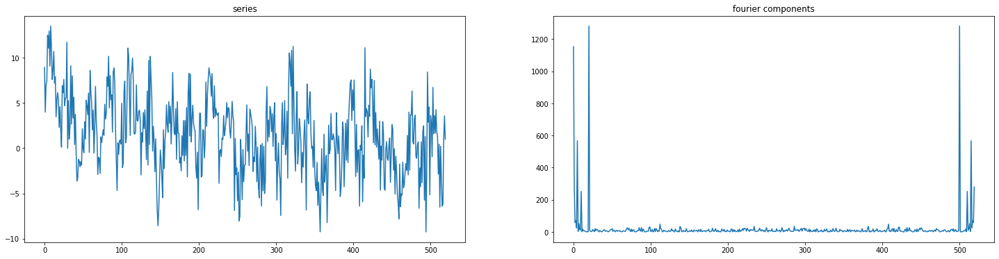

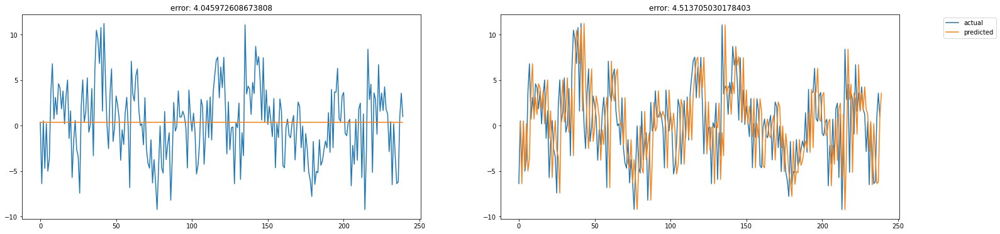

In [30]:
complex_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 3),
    scaler, 
    lags=lags)

In [90]:
complex_noise3_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_noise3_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,3.2280377600977674,0.018059644993276305
Deep_MLP_20_lags,3.211432056072714,0.04291363687025835
Deep_MLP_Dropout_20_lags,3.1921442600394156,0.02209849195076782
RNN_20_lags,3.2775824475306394,0.02713069342833592
RNN_RNN_20_lags,3.286364997292216,0.04027091287972694
LSTM_20_lags,3.25685432141191,0.018895796873603574
GRU_20_lags,3.3149810100181467,0.030174921329602096
CNN_Dropout_20_lags,3.178836387869779,0.010918529214715898
CNN_20_lags,3.18841307229123,0.01124514942786477


LSTM now does the best with this noisy signal.

How do the models behave if we insert 2 fading waves signals hidden in the middel of the others?

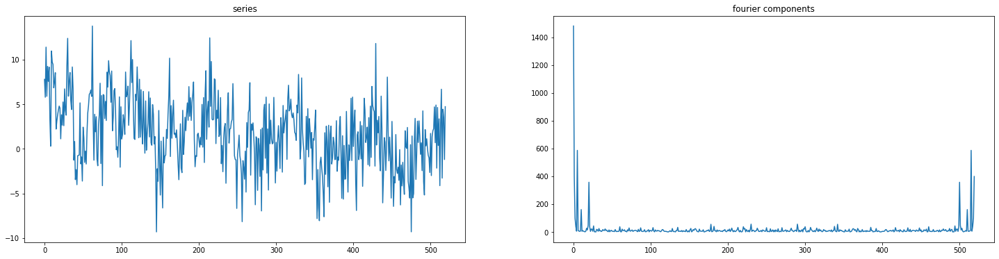

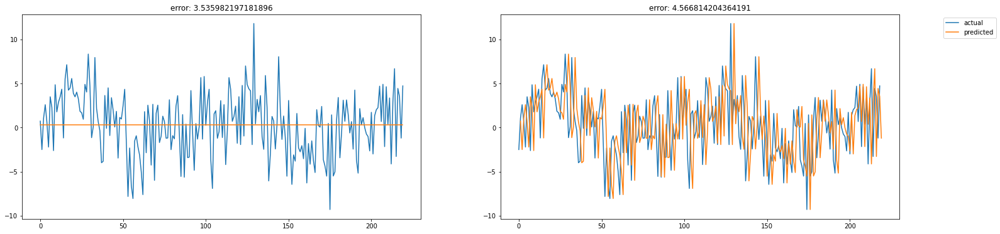

In [39]:
lags=20
complex_fading_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    fading_wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 3),
    scaler, 
    lags=lags)

In [40]:
complex_fading_noise3_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_fading_noise3_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,3.439476275955402,0.02318436499402693
Deep_MLP_20_lags,3.3732658352438607,0.0243636039695842
Deep_MLP_Dropout_20_lags,3.4223300221178903,0.022064200852223152
RNN_20_lags,3.4219653807315766,0.04995614927220094
RNN_RNN_20_lags,3.395998738414117,0.012297448774315763
LSTM_20_lags,3.3328942070886916,0.009856279658695422
GRU_20_lags,3.3518811932324324,0.00944205108844445
CNN_Dropout_20_lags,3.341798966541753,0.019105974547051062
CNN_20_lags,3.3486677603783273,0.011230285505544358


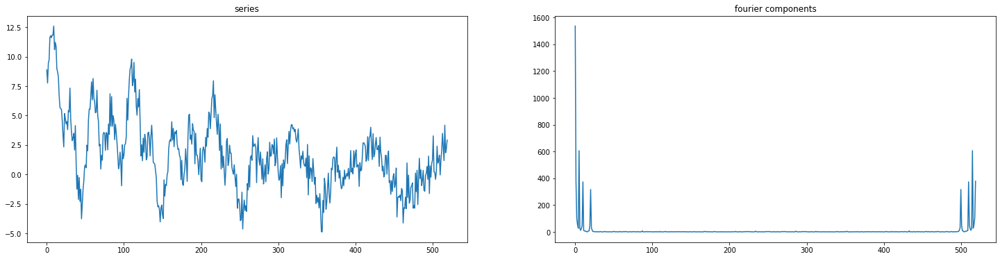

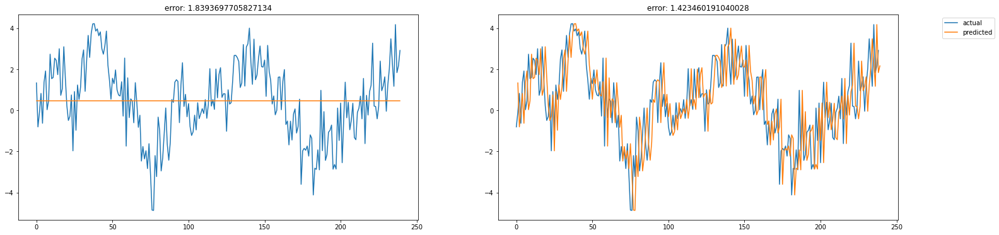

In [31]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    fading_wave(20, resolution, 3, reverse = True) + 
    fading_wave(10, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 1),
    scaler, 
    lags=lags)

In [92]:
fading_complex_noise1_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
fading_complex_noise1_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,1.2178511301398753,0.011515777210970371
Deep_MLP_20_lags,1.231409819619812,0.004712291389174885
Deep_MLP_Dropout_20_lags,1.2176434410541705,0.04091314577930174
RNN_20_lags,1.1869066654053477,0.013983726355337914
RNN_RNN_20_lags,1.19904310077419,0.0307616646808247
LSTM_20_lags,1.1478361237929129,0.0060610040364429164
GRU_20_lags,1.1869361058345251,0.009188882927336597
CNN_Dropout_20_lags,1.1869538045635513,0.013370660178739837
CNN_20_lags,1.1847043740598622,0.008193471767849533


Again CNNs and LSTM does the best result. It is interesting to notice that even the simple MLP is quite good.

Looking at the results, we can say that all the networks are quite good in discovering the underlying patterns of the signals. Anyway, if we have a look at the graphic of the fourier components, the signal looks a bit artifical. The main wave components presents spikes that are too clear.

Let's try to mimic a more realistic signal, with more waves of similar magnitude.

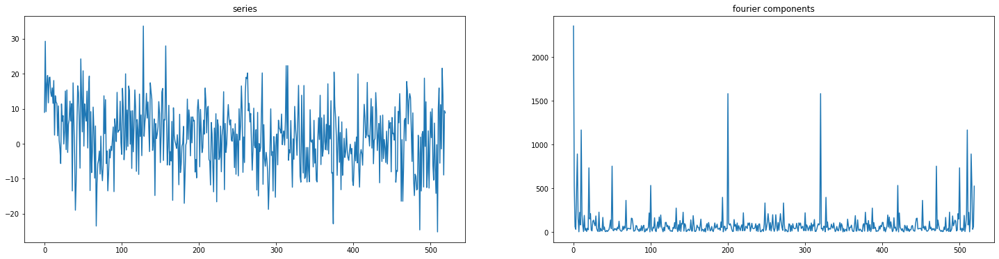

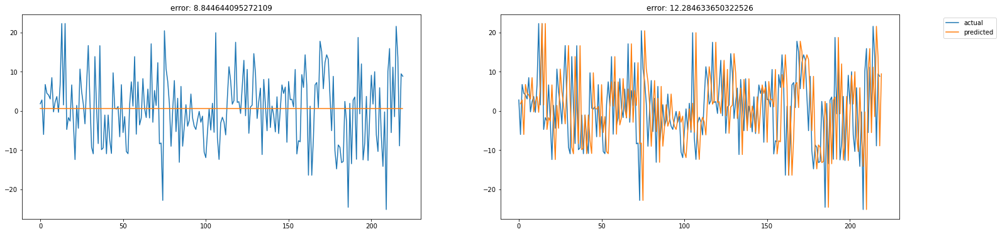

In [93]:
resolution = 520
realistic_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 3, np.cos) + 
    wave(20, resolution, 2, np.cos) +
    wave(5, resolution, 2.5, np.sin) + 
    wave(200, resolution, 3, np.sin) + 
    wave(400, resolution, 2, np.sin) + 
    wave(100, resolution, 2, np.sin) + 
    wave(50, resolution, 3, np.sin) +
    noise(resolution, 8),
    scaler, 
    lags=lags)

In [94]:
realistic_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
realistic_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,8.72408115933677,0.045039236783359124
Deep_MLP_20_lags,8.731322547180872,0.06080641843867485
Deep_MLP_Dropout_20_lags,8.6791595733808,0.0839446615832649
RNN_20_lags,8.66348172106087,0.05323754444186091
RNN_RNN_20_lags,8.739983927857676,0.037343733435409705
LSTM_20_lags,8.802273724201616,0.01295336828268319
GRU_20_lags,8.799323542403325,0.008452058054503461
CNN_Dropout_20_lags,8.691365849256403,0.014027520357237998
CNN_20_lags,8.739318600018027,0.01653338529213125


Here LSTM does the best, but no model present anything actually satisfying. Let's try to lower the noise.

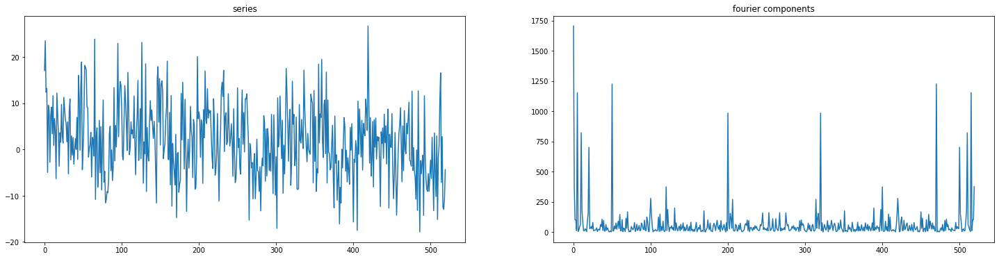

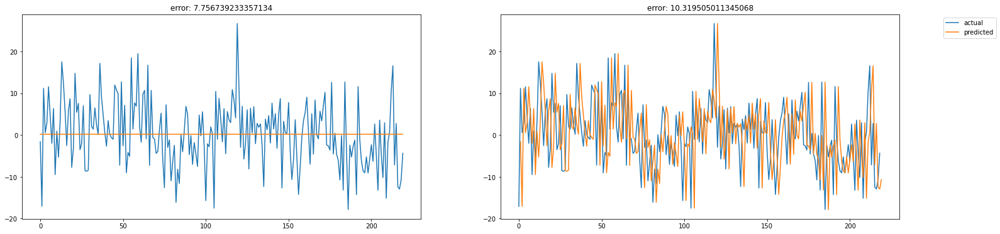

In [19]:
resolution = 520
realistic_series_noise6, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 3, np.cos) + 
    wave(20, resolution, 2, np.cos) +
    wave(5, resolution, 2.5, np.sin) + 
    wave(200, resolution, 3, np.sin) + 
    wave(400, resolution, 2, np.sin) + 
    wave(100, resolution, 2, np.sin) + 
    wave(50, resolution, 3, np.sin) +
    noise(resolution, 6),
    scaler, 
    lags=lags)

In [20]:
lags=20
realistic_noise6_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
realistic_noise6_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,7.451423099345712,0.056723695312584636
Deep_MLP_20_lags,7.391369096308272,0.05711002163867467
Deep_MLP_Dropout_20_lags,7.408172724599905,0.05930270152345622
RNN_20_lags,7.4604111087313765,0.12269437536727239
RNN_RNN_20_lags,7.452365855994065,0.0988007676021745
LSTM_20_lags,7.560186570649722,0.0055076236435620774
GRU_20_lags,7.568173443711139,0.005843976733919893
CNN_Dropout_20_lags,7.309295637047029,0.022720899107888857
CNN_20_lags,7.310872515813095,0.04901430877254413


Now CNNs wins, but we are still very far from the target noise value.

Up to now we feed the networks only with values coming from the series itself. Does the prediction would improve if we try to include some aggregated information coming from the past of the series?

For example, what if we introduce the average values of the previous 4 lags, the previous 12 lags and the same aggregations, but 48 lags before

NameError: name 'complex_fasing_series_noise3' is not defined

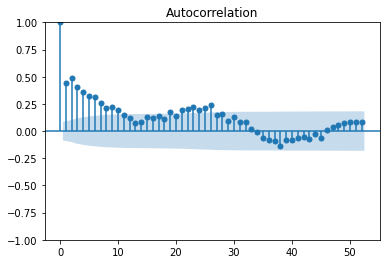

In [45]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf

p1 = plot_acf(complex_series_noise3, lags=52)
p2 = plot_acf(complex_fasing_series_noise3, lags=52)
p3 = plot_acf(realistic_series_noise6, lags=52)

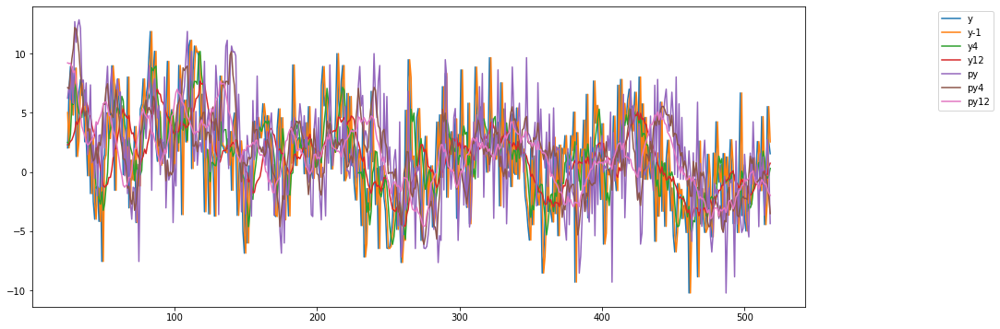

In [46]:
def prepare_data_multivariate(series: np.array):
    series = pd.Series(series)
    series_averages_df = pd.DataFrame({'y-1':series})
    series_averages_df['y4'] = series.rolling(window = 4).mean()
    series_averages_df['y12'] = series.rolling(window = 12).mean()
    
    acf_array = acf(series, nlags=52)
    shift_value = (acf_array[12:].argmax() + 12) - 1
    
    series_averages_df['py'] = series.shift(shift_value)
    series_averages_df['py4'] = series_averages_df['y4'].shift(shift_value - 3)
    series_averages_df['py12'] = series_averages_df['y12'].shift(shift_value - 11)
    series_averages_df['y'] = series.shift(-1)
    
    return series_averages_df.dropna()

multi_series: pd.DataFrame = prepare_data_multivariate(complex_series_noise3)
multi_series.head(10)

plot([multi_series['y'], multi_series['y-1'], multi_series['y4'], multi_series['y12'], multi_series['py'], multi_series['py4'], multi_series['py12']], labels=['y','y-1','y4','y12','py','py4','py12'])
plot_px([multi_series['y'], multi_series['y-1'], multi_series['y4'], multi_series['y12'], multi_series['py'], multi_series['py4'], multi_series['py12']], labels=['y','y-1','y4','y12','py','py4','py12'])

In [42]:
def prepare_lags_multivariate(series: pd.DataFrame, lags: int):
    range_right = lags + 1
    lags_data = np.array([series.shift(range_right - i) for i in range(1, range_right)])
    lags_data = lags_data.transpose(1, 0, 2)
    lags_data = np.array(list(filter(lambda x: not np.isnan(x).any(), lags_data)))
    
    return lags_data, lags_data[:, :, :-1], lags_data[:, :, -1]

def split_test_multivariate(series: np.array, split_percentage=0.8):
    train_len = int(len(series) * split_percentage)
    train = series[:train_len]
    test = series[train_len:]
    
    return train[:, :, :-1], train[:, -1, -1], test[:, :, :-1], test[:, -1, -1], train, test

def new_series_multivariate(series: np.array, scaler: MinMaxScaler, lags=10):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    ax[0].plot(series)
    ax[0].set_title('series')
    ax[1].plot(fft(series))
    ax[1].set_title('fourier components')
    plt.show()

    scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
    multivariate_series = prepare_data_multivariate(scaled_series)
    lagged_series, _, _ = prepare_lags_multivariate(multivariate_series, lags=lags)
    X_train, y_train, X_test, y_test, train_df, test_df = split_test_multivariate(lagged_series, 0.6)

    y_test_unscaled = unscale(y_test, scaler)
    
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(y_test_unscaled, [y_test_unscaled.mean()] * len(y_test_unscaled), show=False, ax=ax[0])
    evaluate(y_test_unscaled[1:], pd.DataFrame(y_test_unscaled).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()
    
    return series, X_train, y_train, X_test, y_test, lagged_series_df

def evaluate_all_models_multivariate(X_train, y_train, X_test, y_test, scaler, verbose=False, plot=True, print_summary=True, first_hidden_num=20):
    lags = X_train.shape[1]
    result = {}

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Simple_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dropout(0.1),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(20, activation=activations.elu, return_sequences=True),
            layers.SimpleRNN(10, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.LSTM(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'LSTM_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.GRU(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'GRU_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.elu, padding='same'),
            layers.Flatten(),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.elu, padding='same'),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Dropout_CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(10,5), input_shape=(X_train.shape[1], X_train.shape[2], 1), activation=activations.elu, padding='same'),
            layers.MaxPooling2D(pool_size=(2,2), strides=[2, 2]),
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.elu),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    
    result2 = np.array([[k, v[1], v[2]] for k,v in zip(result.keys(), result.values())])
    return pd.DataFrame({'avg': result2[:, 1], 'std': result2[:, 2]}, index = result2[:, 0])

Look that all the models improves when feeding a multivariate series. The models that benefit the most are the MLP models, with Deep_MLP_Dropout_20_lags that now performs even better then CNN and LSTM.

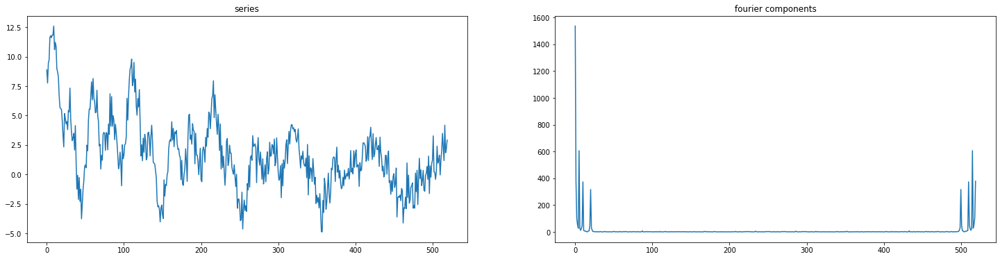

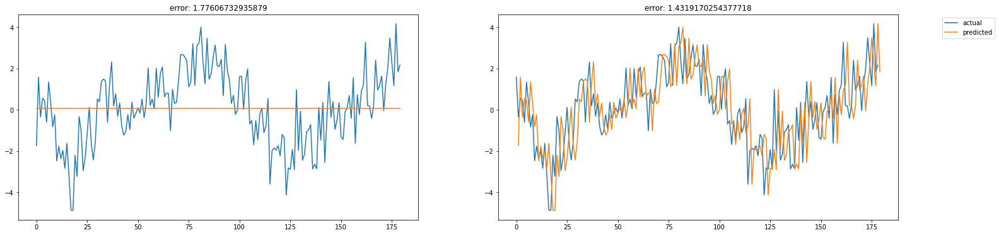

KeyboardInterrupt: 

In [37]:
lags=20
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fasing_series_noise3, scaler, lags)
complex_fasing_series_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_fasing_series_noise3_result_20_lags_all_models

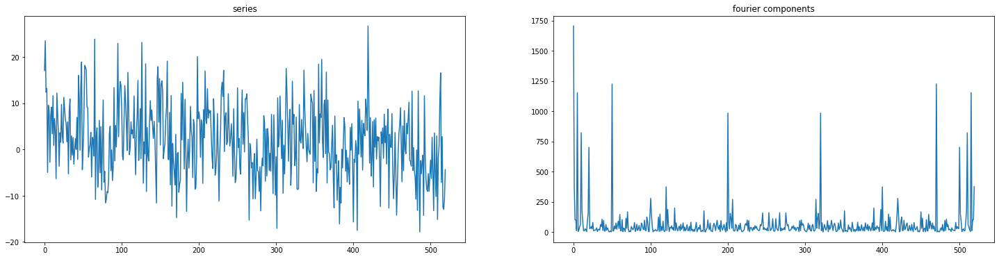

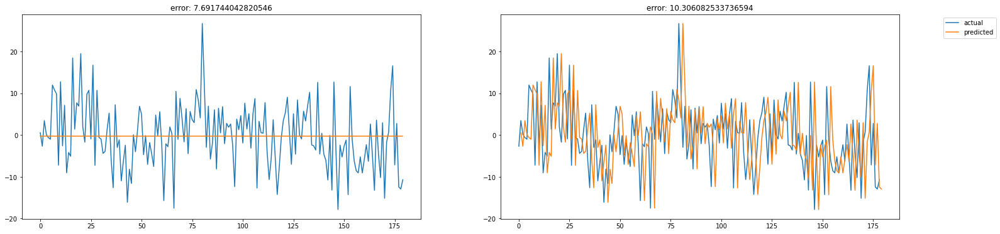

,avg,std
Simple_MLP_20_lags,7.211659104667348,0.189457169592736
Deep_MLP_20_lags,7.042066868165908,0.04967132974813514
Deep_MLP_Dropout_20_lags,6.972272226778865,0.07603797047070716
RNN_20_lags,7.151364699359647,0.16355438653346857
RNN_RNN_20_lags,7.301069568555718,0.133319188007368
LSTM_20_lags,7.14781245865984,0.020661586442837433
GRU_20_lags,7.133663645373173,0.030505996633790344
CNN_2D_20_lags,7.040548050552525,0.11456161370602744
Dropout_CNN_2D_20_lags,7.251502381349606,0.22407112332538112
Deep_CNN_2D_20_lags,7.367749256456134,0.3550521999424606


In [38]:
lags=20
realistic_noise6_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(realistic_series_noise6, scaler, lags)
realistic_noise6_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
realistic_noise6_multivariate_result_20_lags_all_models

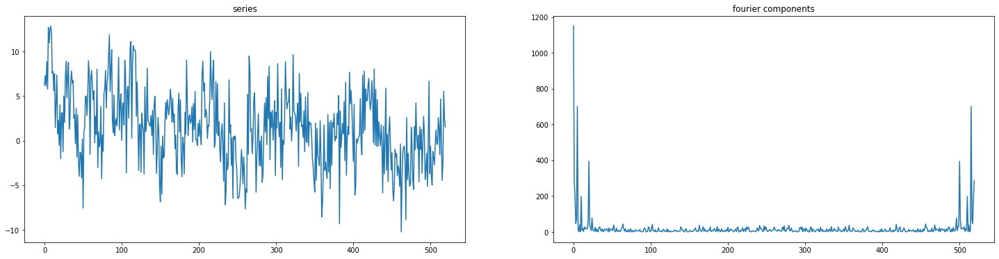

NameError: name 'prepare_data_multivariate' is not defined

In [43]:
complex_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_series_noise3, scaler, lags)
complex_multivariate_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_multivariate_noise3_result_20_lags_all_models

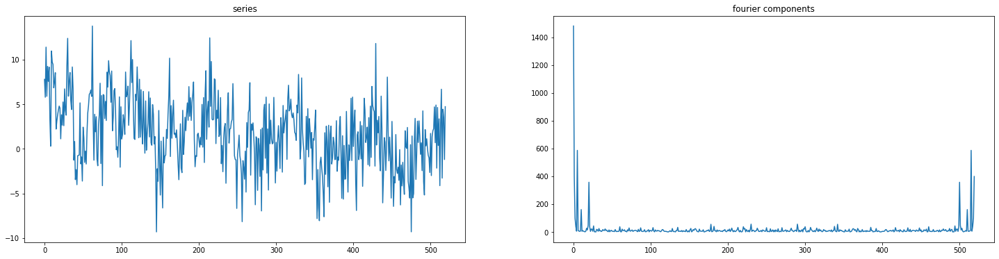

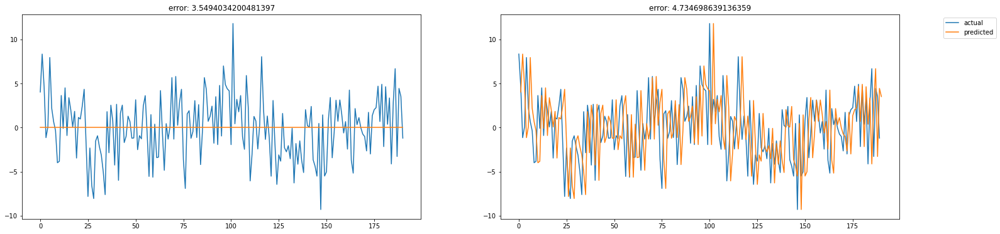

,avg,std
Simple_MLP_20_lags,3.599914736277129,0.035146642902208425
Deep_MLP_20_lags,3.4639706579722214,0.06715851466622424
Deep_MLP_Dropout_20_lags,3.441757332778581,0.016067839237846496
RNN_20_lags,3.5985180410260846,0.04463996991235514
RNN_RNN_20_lags,3.5480237589177555,0.05079553665356017
LSTM_20_lags,3.4137401721608875,0.015059828547143715
GRU_20_lags,3.4332233495024957,0.024205477932863578
CNN_2D_20_lags,3.487762153948542,0.04559085620266324
Dropout_CNN_2D_20_lags,3.579181213108962,0.07278821779043049
Deep_CNN_2D_20_lags,3.547037105991835,0.1273031922312506


In [47]:
complex_fading_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fading_series_noise3, scaler, lags)
complex_fading_multivariate_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_fading_multivariate_noise3_result_20_lags_all_models

Let's also try a convolutional LSTM. We will see no real improvement.

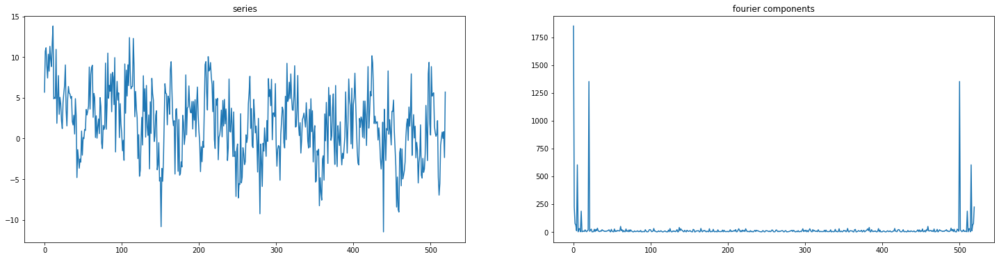

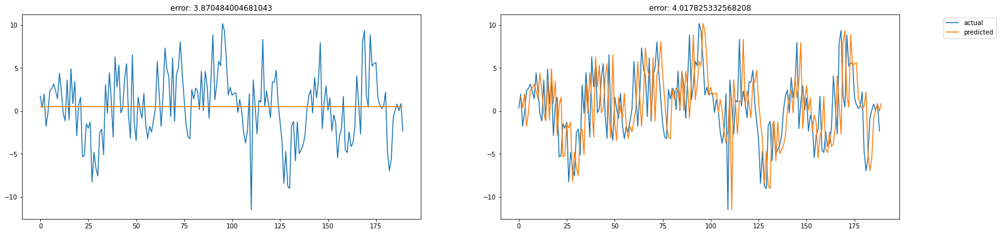

Restoring model weights from the end of the best epoch: 60.
Epoch 90: early stopping
6/6 [==============================] - 0s 22ms/step
Restoring model weights from the end of the best epoch: 46.
Epoch 76: early stopping
6/6 [==============================] - 0s 26ms/step
Restoring model weights from the end of the best epoch: 43.
Epoch 73: early stopping
6/6 [==============================] - 0s 22ms/step
Restoring model weights from the end of the best epoch: 36.
Epoch 66: early stopping
6/6 [==============================] - 0s 17ms/step
Restoring model weights from the end of the best epoch: 48.
Epoch 78: early stopping
6/6 [==============================] - 0s 20ms/step
Model: "ConvLSTM2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 6, 10)          6640      
                                                                 
 flatten_29 (Flatten)  

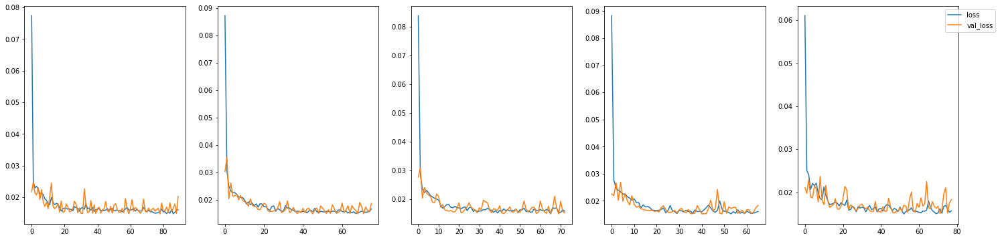

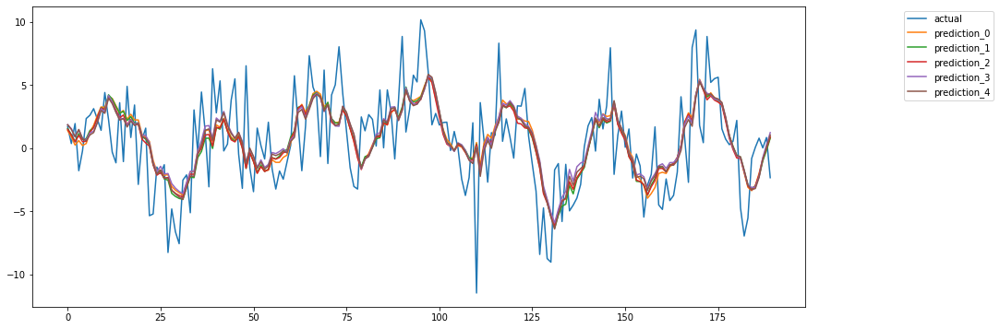

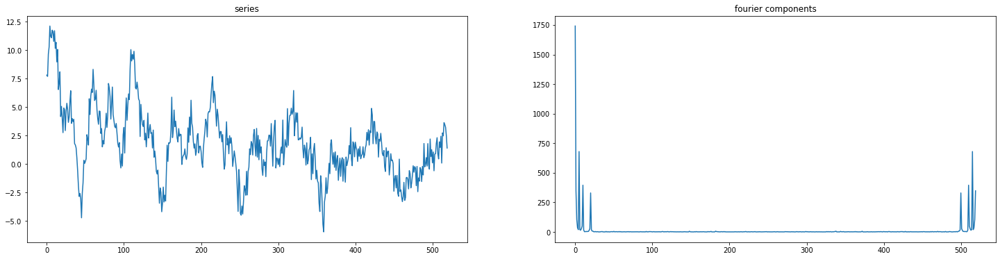

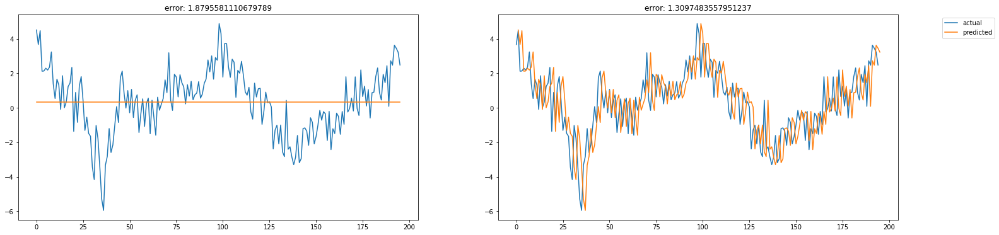

Restoring model weights from the end of the best epoch: 26.
Epoch 56: early stopping
7/7 [==============================] - 0s 18ms/step
Restoring model weights from the end of the best epoch: 16.
Epoch 46: early stopping
7/7 [==============================] - 0s 17ms/step
Restoring model weights from the end of the best epoch: 40.
Epoch 70: early stopping
7/7 [==============================] - 0s 14ms/step
Restoring model weights from the end of the best epoch: 34.
Epoch 64: early stopping
7/7 [==============================] - 0s 13ms/step
Restoring model weights from the end of the best epoch: 32.
Epoch 62: early stopping
7/7 [==============================] - 0s 15ms/step
Model: "ConvLSTM2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_1 (ConvLSTM2D)  (None, 1, 6, 10)          6640      
                                                                 
 flatten_30 (Flatten)  

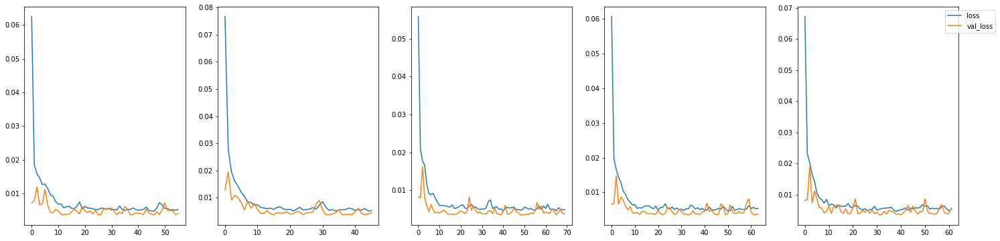

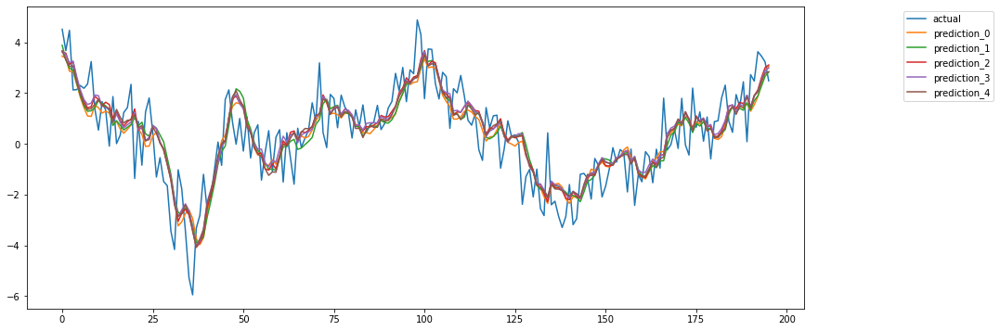

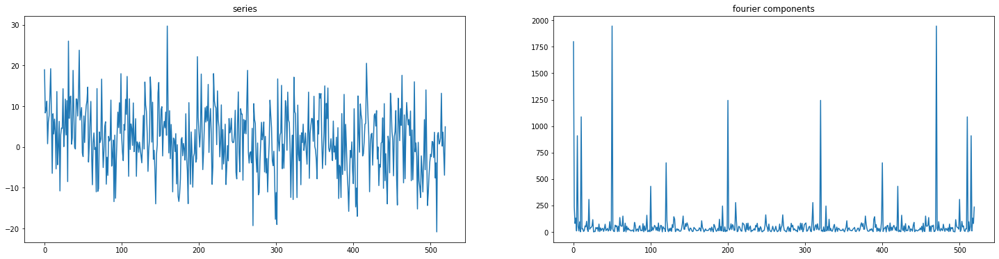

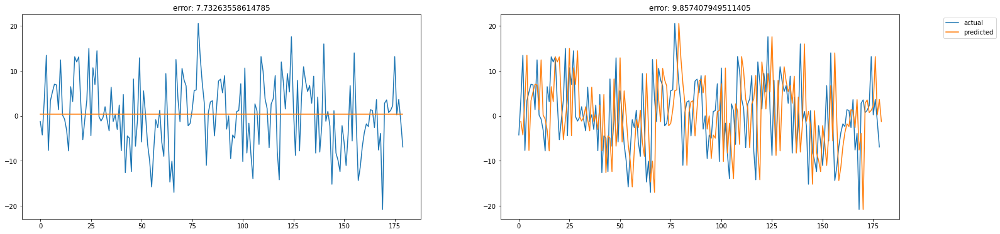

Restoring model weights from the end of the best epoch: 69.
Epoch 99: early stopping
6/6 [==============================] - 0s 15ms/step
Restoring model weights from the end of the best epoch: 101.
Epoch 131: early stopping
6/6 [==============================] - 0s 16ms/step
Restoring model weights from the end of the best epoch: 92.
Epoch 122: early stopping
6/6 [==============================] - 0s 19ms/step
Restoring model weights from the end of the best epoch: 151.
Epoch 181: early stopping
6/6 [==============================] - 0s 19ms/step
Restoring model weights from the end of the best epoch: 44.
Epoch 74: early stopping
6/6 [==============================] - 0s 17ms/step
Model: "ConvLSTM2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_2 (ConvLSTM2D)  (None, 1, 6, 10)          6640      
                                                                 
 flatten_31 (Flatt

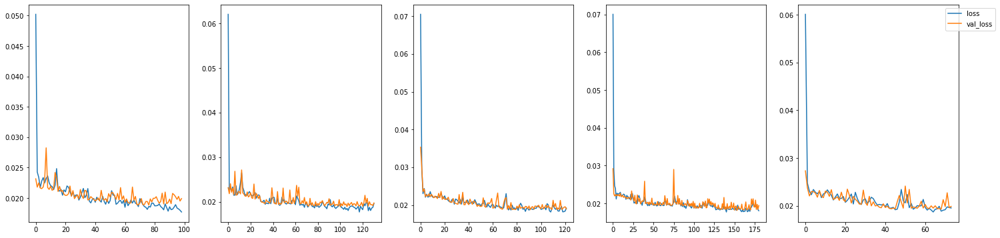

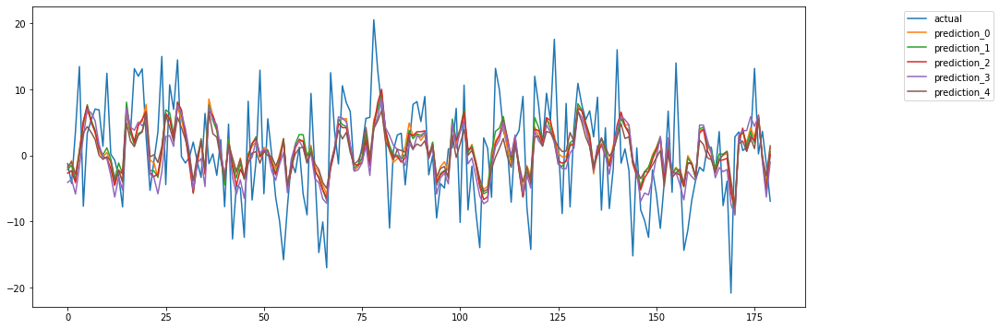

In [103]:

def evaluate_CONV_LSTM(series: np.array, scaler: MinMaxScaler, lags: int):    
    _, X_train, y_train, X_test, y_test, _ = new_series_multivariate(series, scaler, lags)
    evaluate_model(
        5,
        [
            layers.ConvLSTM2D(10, kernel_size=(5,3), activation=activations.elu, padding='same'),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1, X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1, X_test.shape[2], 1),
        y_test,
        epochs=200,
        batch_size=32,
        name=f'ConvLSTM2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=False,
        print_plot=True,
        print_summary=True
    )
    
lags=20
evaluate_CONV_LSTM(complex_series_noise3, scaler, lags)
evaluate_CONV_LSTM(complex_fasing_series_noise3, scaler, lags)
evaluate_CONV_LSTM(realistic_series_noise6, scaler, lags)


Now, some random experiments.

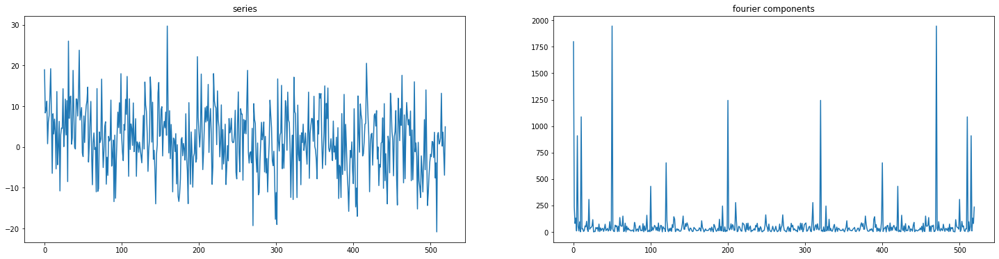

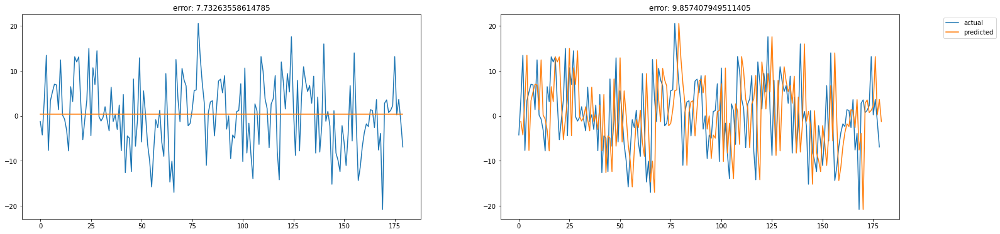

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_395 (Dense)           (None, 20)                2420      
                                                                 
 dense_396 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [6.730098362483429, 6.692137010743961, 6.629229183863188, 6.645476605992178, 6.681955591005257]
error avg: 6.675779350817602
error std: 0.035613054901013


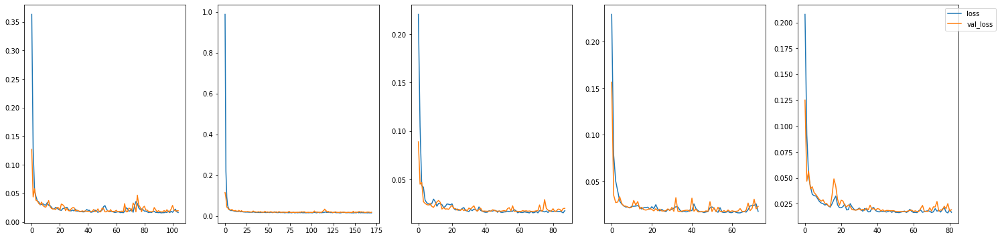

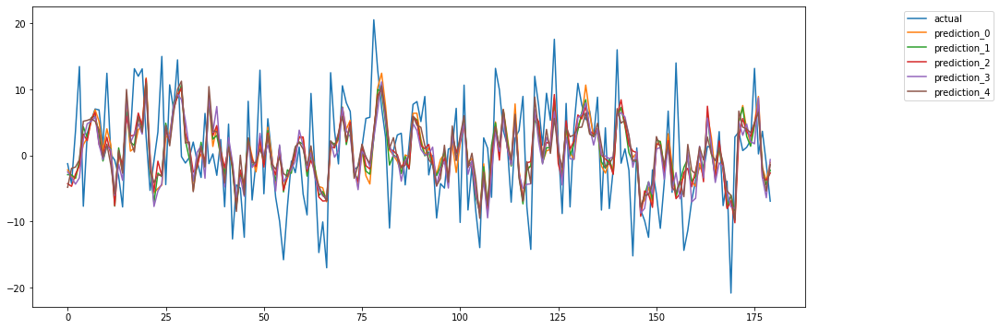

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_397 (Dense)           (None, 20)                2420      
                                                                 
 dense_398 (Dense)           (None, 100)               2100      
                                                                 
 dense_399 (Dense)           (None, 10)                1010      
                                                                 
 dense_400 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [6.644039190612573, 6.5759966354912285, 6.608478730120649, 6.650703672029661, 6.698851691131706]
error avg: 6.635613983877164
error std: 0.04144451867469476


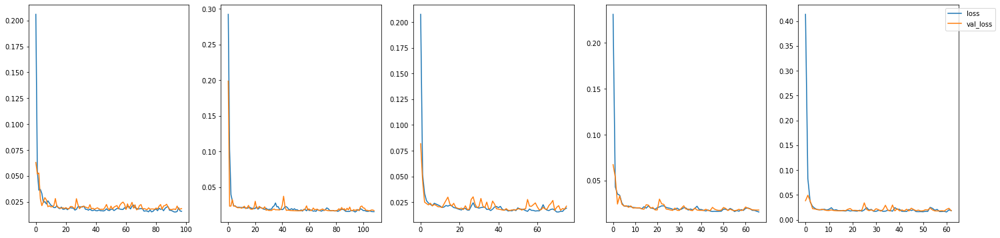

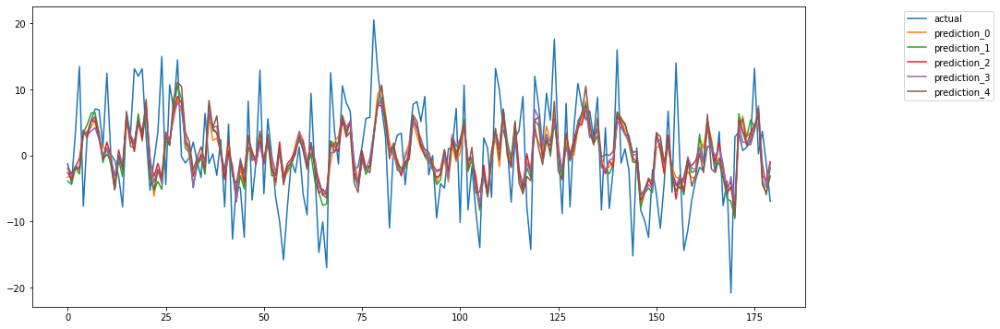

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_401 (Dense)           (None, 20)                2420      
                                                                 
 dense_402 (Dense)           (None, 100)               2100      
                                                                 
 dropout_33 (Dropout)        (None, 100)               0         
                                                                 
 dense_403 (Dense)           (None, 10)                1010      
                                                                 
 dense_404 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [6.662220243749311, 6.6067421171

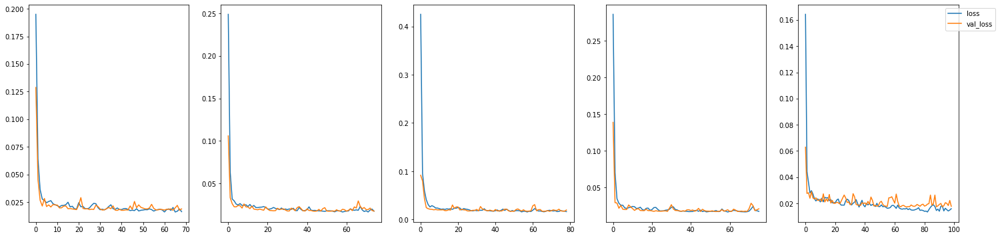

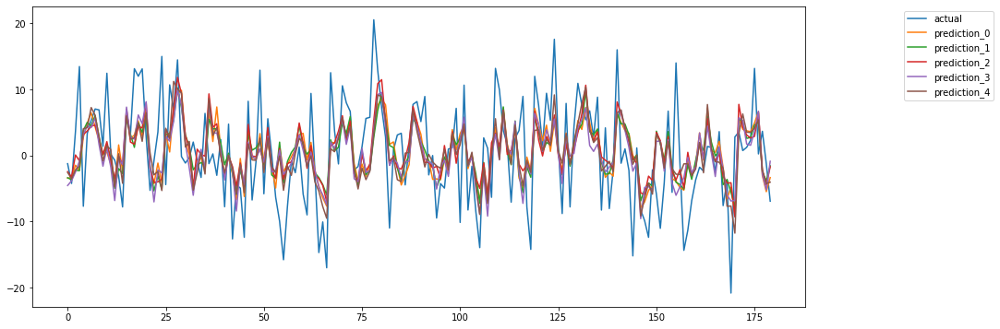

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_46 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_405 (Dense)           (None, 5)                 105       
                                                                 
 dense_406 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [6.948158814552643, 6.69687660710602, 6.764852689744674, 6.850093140276671, 6.789183470949487]
error avg: 6.809832944525899
error std: 0.08481000875253657


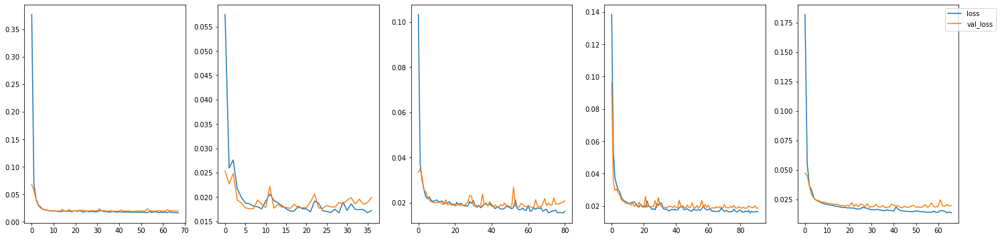

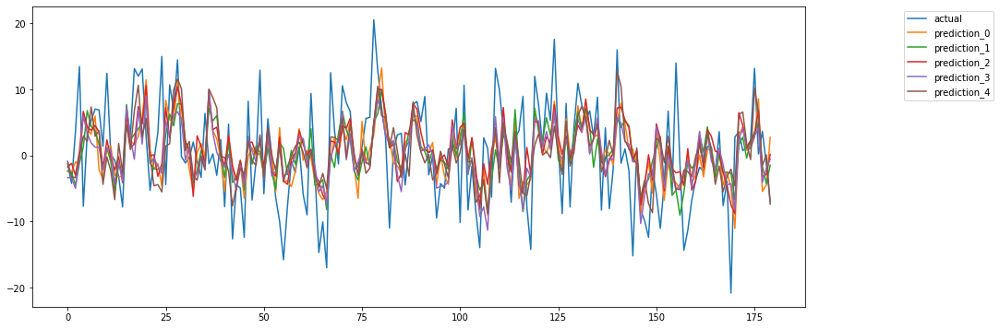

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_47 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_48 (SimpleRNN)   (None, 10)                310       
                                                                 
 dense_407 (Dense)           (None, 5)                 55        
                                                                 
 dense_408 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [6.763739578471339, 7.007407576881707, 7.050416924466512, 6.918945663411528, 6.882488412434482]
error avg: 6.924599631133113
error std: 0.10036774961557494


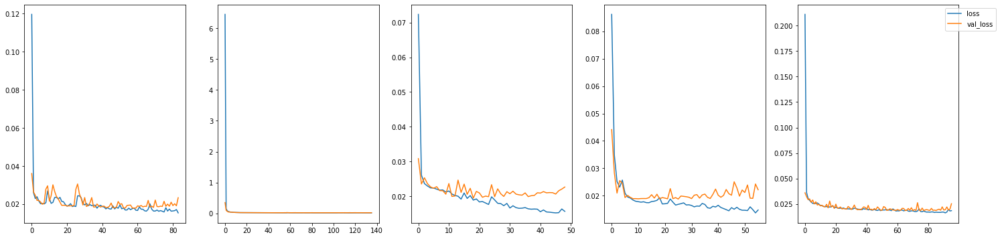

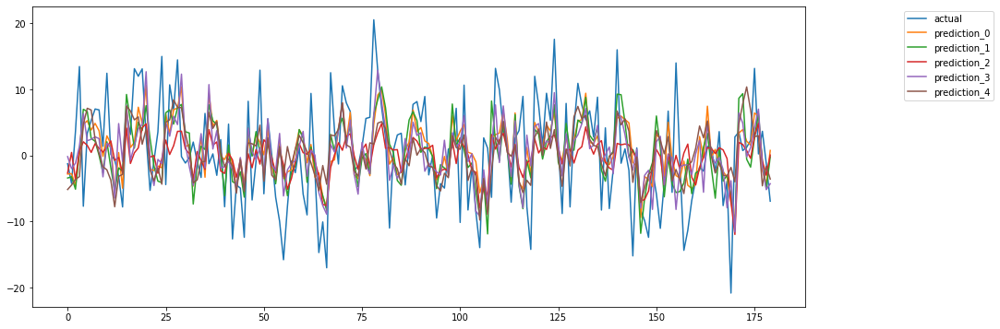

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 20)                2160      
                                                                 
 dense_409 (Dense)           (None, 5)                 105       
                                                                 
 dense_410 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [6.879520743485605, 7.007518244760364, 7.023293590266041, 7.0101199404136185, 7.048348179286181]
error avg: 6.993760139642362
error std: 0.058923080282466844


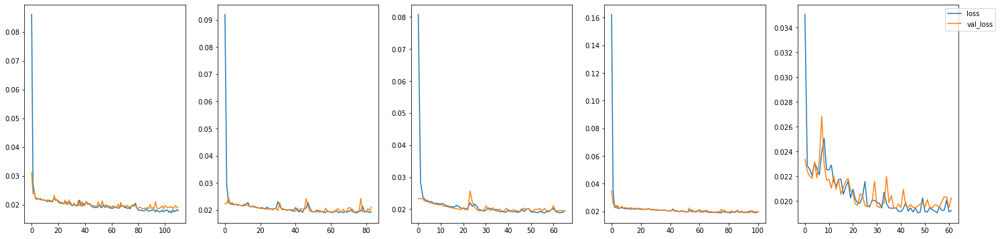

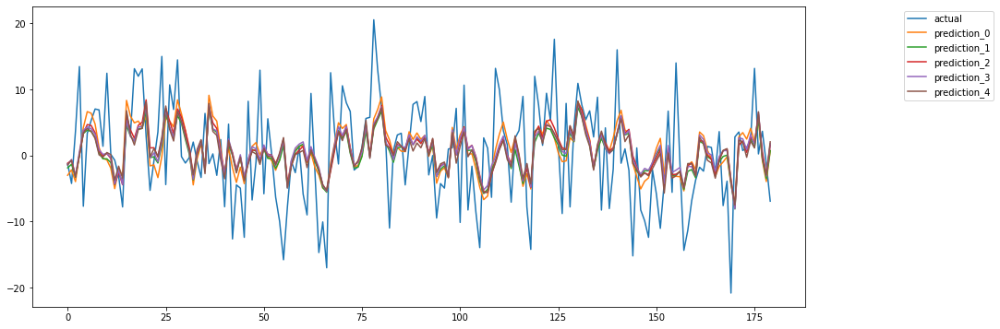

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_15 (GRU)                (None, 20)                1680      
                                                                 
 dense_411 (Dense)           (None, 5)                 105       
                                                                 
 dense_412 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [6.989929786328703, 6.980885651001549, 6.99085634675767, 6.9691280694378825, 6.985408119887391]
error avg: 6.983241594682639
error std: 0.00790129424315194


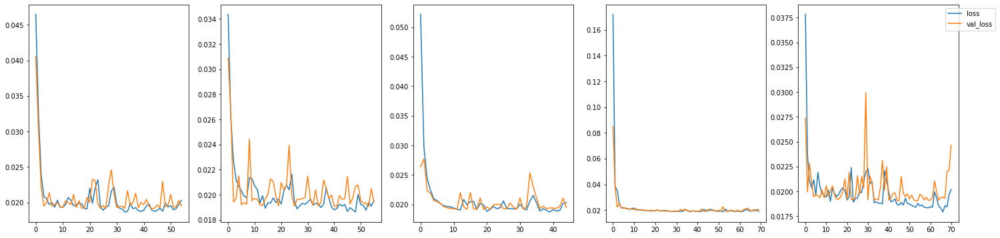

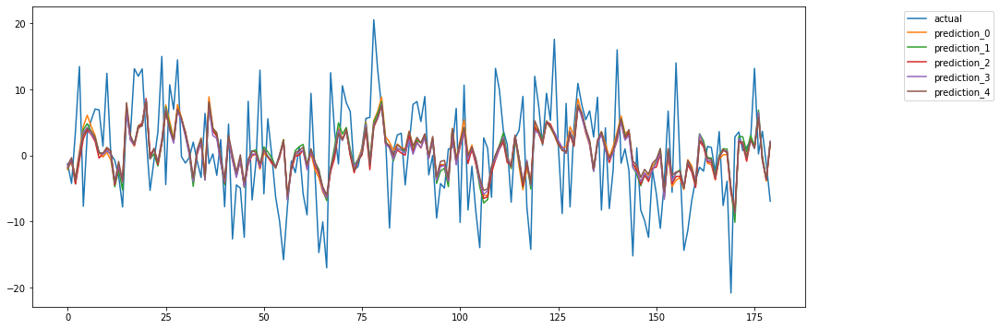

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_32 (Flatten)        (None, 7680)              0         
                                                                 
 dense_413 (Dense)           (None, 5)                 38405     
                                                                 
 dense_414 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [6.682111017423291, 6.60853126995166, 6.720855529124814, 6.6801601858722615, 7.788298581743456]
error avg: 6.895991316823097
error std: 0.4476261693128644


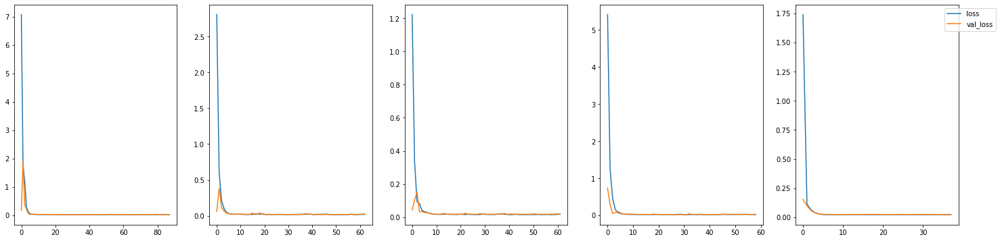

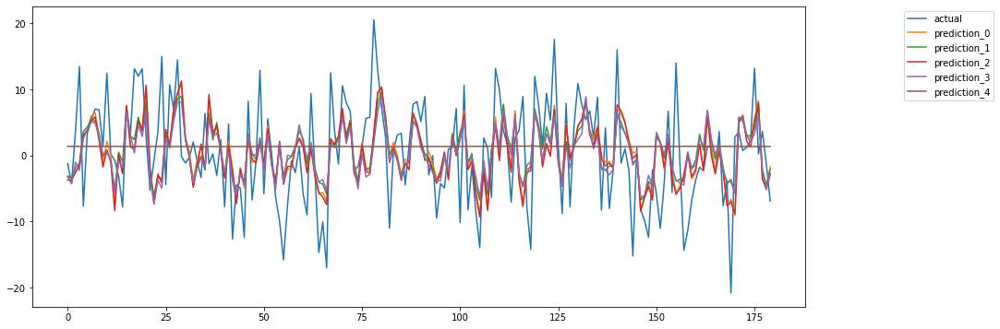

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_33 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_34 (Dropout)        (None, 7680)              0         
                                                                 
 dense_415 (Dense)           (None, 5)                 38405     
                                                                 
 dense_416 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [6.70701171919874, 6.72037695384

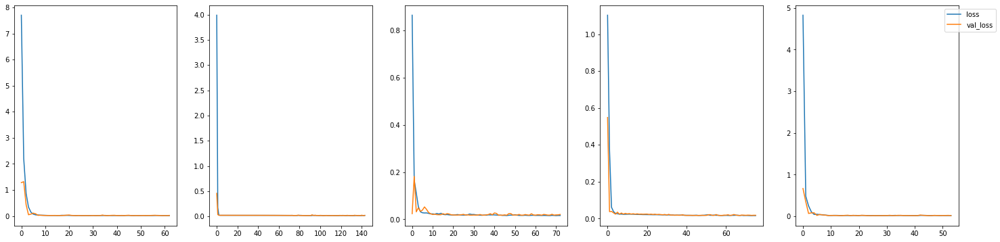

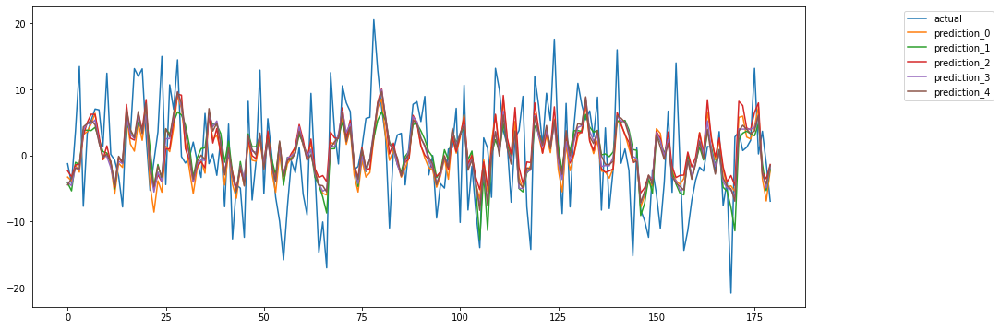

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_14 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 10, 3, 64)        0         
 2D)                                                             
                                                                 
 conv2d_15 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_34 (Flatten)        (None, 384)               0         
                                                                 
 dropout_35 (Dropout)        (None, 384)               0         
                                                                 
 dense_417 (Dense)           (None, 5)                 1925      
                                               

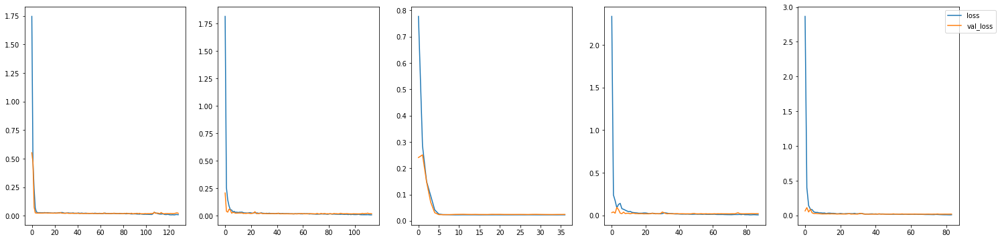

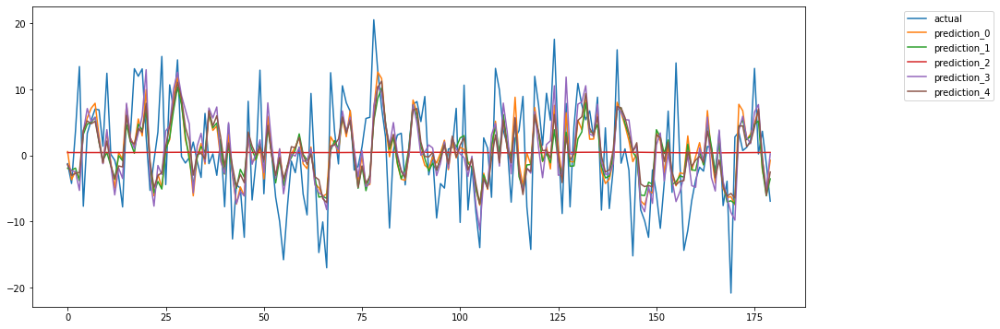

,avg,std
Simple_MLP_20_lags,6.675779350817602,0.035613054901013
Deep_MLP_20_lags,6.635613983877164,0.04144451867469476
Deep_MLP_Dropout_20_lags,6.62831635824552,0.019322278572874222
RNN_20_lags,6.809832944525899,0.08481000875253657
RNN_RNN_20_lags,6.924599631133113,0.10036774961557494
LSTM_20_lags,6.993760139642362,0.058923080282466844
GRU_20_lags,6.983241594682639,0.00790129424315194
CNN_2D_20_lags,6.895991316823097,0.4476261693128644
Dropout_CNN_2D_20_lags,6.658464590326235,0.048972875909990304
Deep_CNN_2D_20_lags,6.876651950392429,0.4284244206524147


In [104]:
realistic_noise6_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(realistic_series_noise6, scaler, lags)
realistic_noise6_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
realistic_noise6_multivariate_result_20_lags_all_models

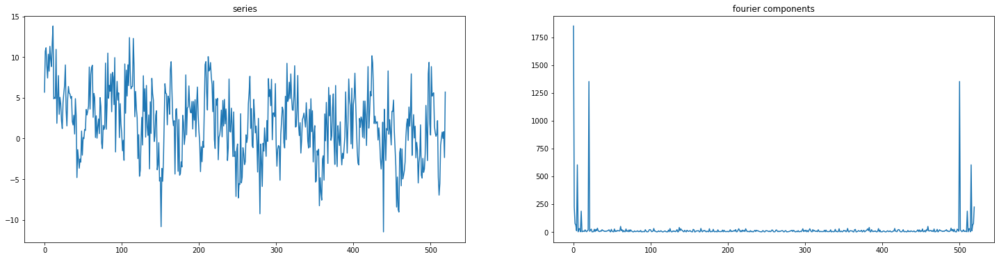

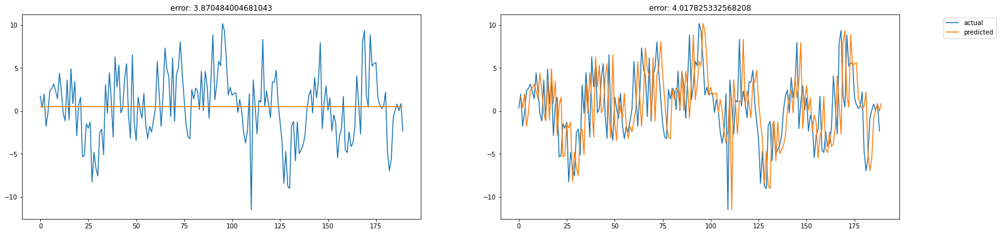

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_419 (Dense)           (None, 20)                2420      
                                                                 
 dense_420 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [3.209685496054177, 3.104046275112825, 3.179570314874939, 3.208076964322173, 3.248704660800204]
error avg: 3.1900167422328636
error std: 0.048285302827977473


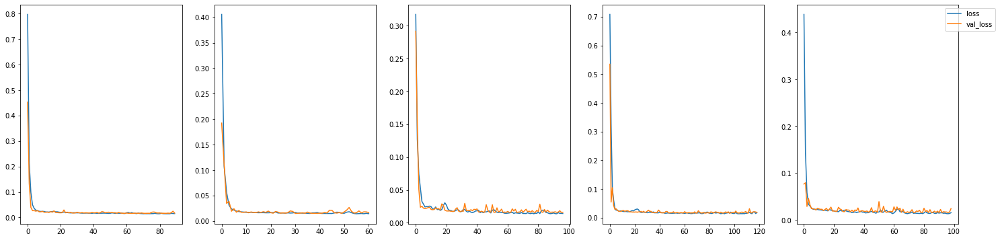

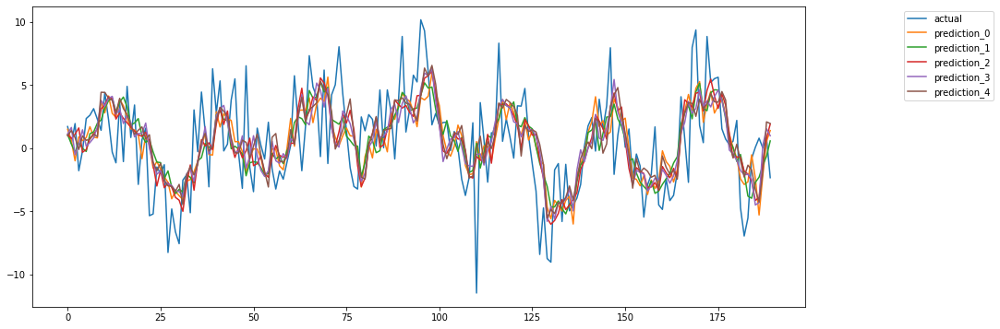

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_421 (Dense)           (None, 20)                2420      
                                                                 
 dense_422 (Dense)           (None, 100)               2100      
                                                                 
 dense_423 (Dense)           (None, 10)                1010      
                                                                 
 dense_424 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [3.0589661396504875, 3.128973463500786, 3.096522148042655, 3.0863601435642165, 3.2146554851563476]
error avg: 3.1170954759828984
error std: 0.05367678120243206


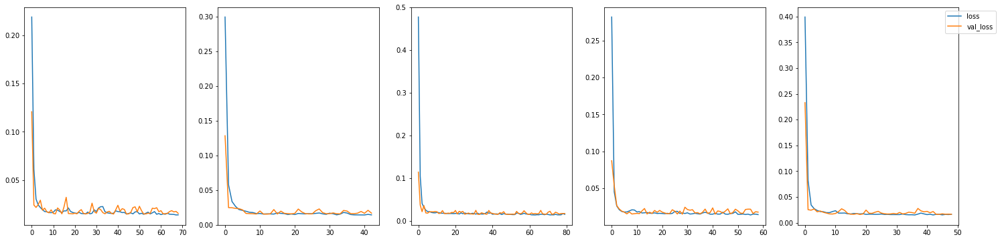

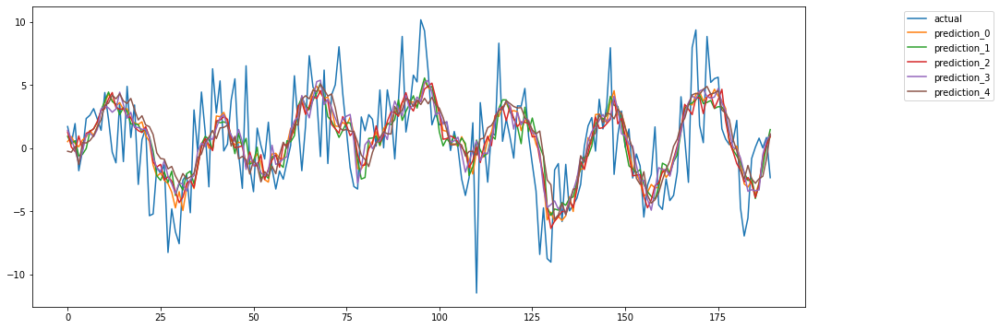

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_425 (Dense)           (None, 20)                2420      
                                                                 
 dense_426 (Dense)           (None, 100)               2100      
                                                                 
 dropout_36 (Dropout)        (None, 100)               0         
                                                                 
 dense_427 (Dense)           (None, 10)                1010      
                                                                 
 dense_428 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [3.113521780527804, 3.1361109892

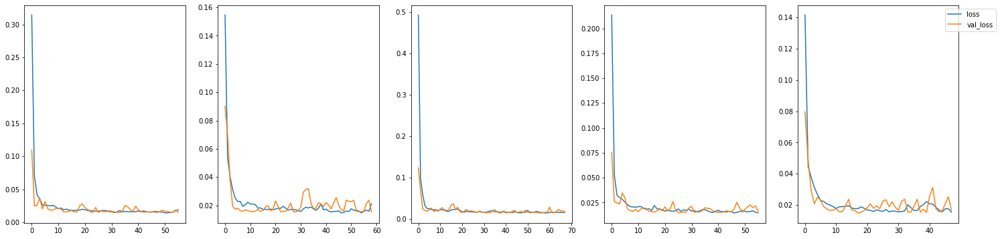

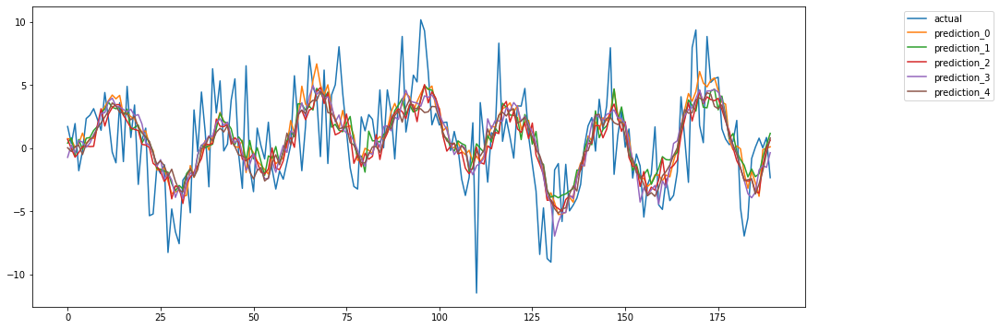

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_49 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_429 (Dense)           (None, 5)                 105       
                                                                 
 dense_430 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [3.408759329059701, 3.2785407992408255, 3.289628536252433, 3.320674452504634, 3.286483765090149]
error avg: 3.3168173764295488
error std: 0.04815113094755919


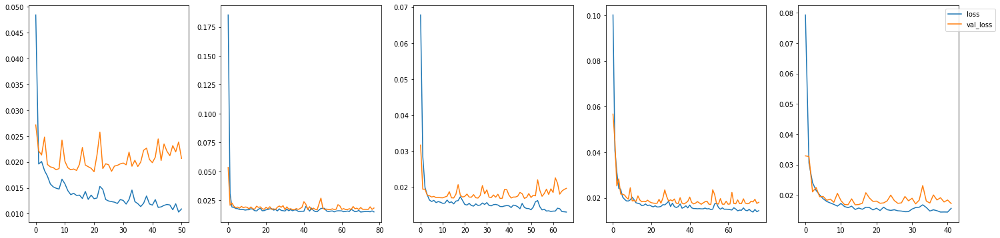

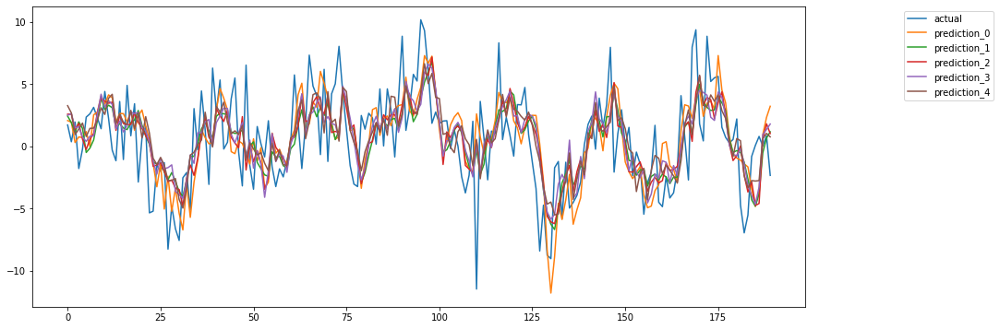

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_50 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_51 (SimpleRNN)   (None, 10)                310       
                                                                 
 dense_431 (Dense)           (None, 5)                 55        
                                                                 
 dense_432 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [3.2070408252210023, 3.1769427233659235, 3.271954765862333, 3.325404720882063, 3.29579887868096]
error avg: 3.2554283828024557
error std: 0.055318967147688934


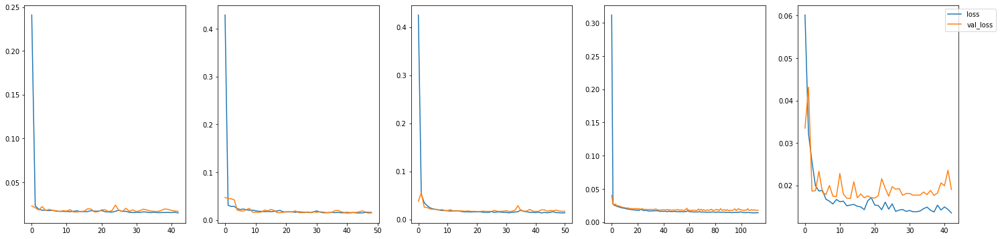

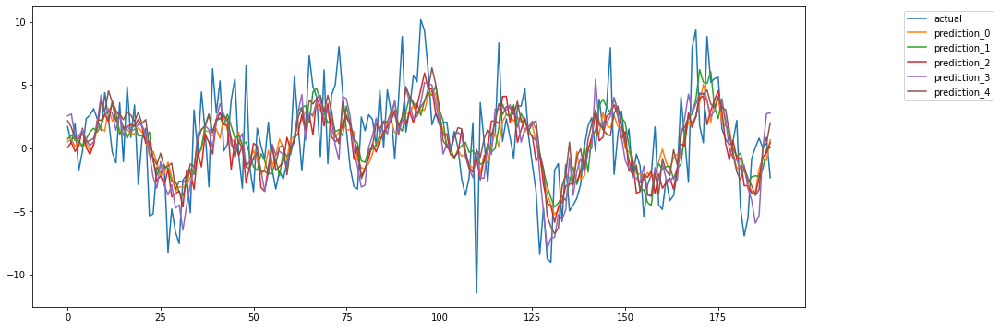

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_17 (LSTM)              (None, 20)                2160      
                                                                 
 dense_433 (Dense)           (None, 5)                 105       
                                                                 
 dense_434 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [3.0980355660913106, 3.086573779020602, 3.1178620361161076, 3.106994014316736, 3.0992173577467534]
error avg: 3.101736550658302
error std: 0.010369430734591017


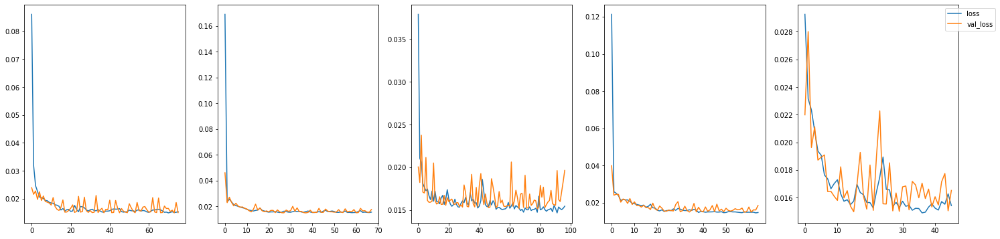

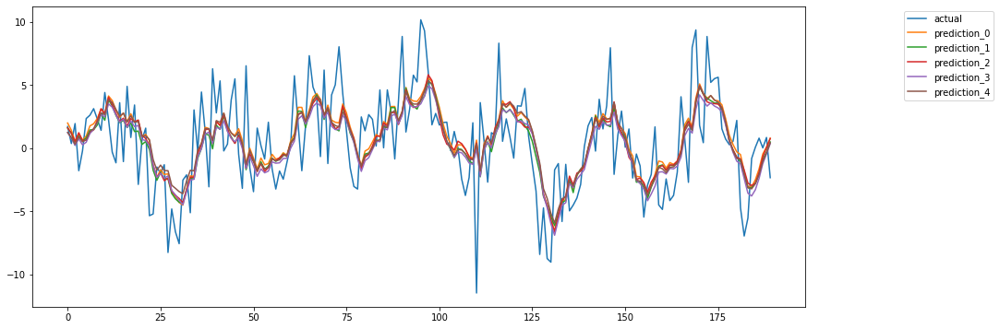

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_16 (GRU)                (None, 20)                1680      
                                                                 
 dense_435 (Dense)           (None, 5)                 105       
                                                                 
 dense_436 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [3.212674009333419, 3.196263537840313, 3.2220688184527737, 3.134300880341794, 3.1944359723244706]
error avg: 3.191948643658554
error std: 0.03060991814137519


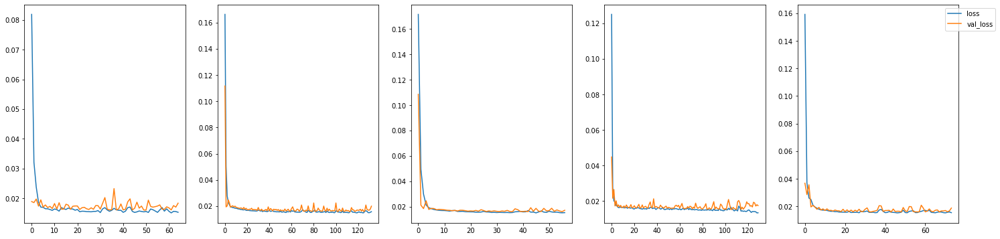

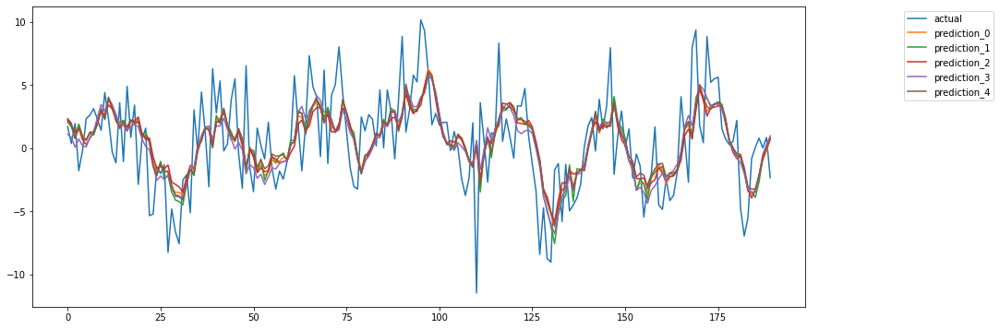

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_35 (Flatten)        (None, 7680)              0         
                                                                 
 dense_437 (Dense)           (None, 5)                 38405     
                                                                 
 dense_438 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [3.1493280672470347, 3.1375191776361055, 3.075478085316856, 3.196271211132876, 3.1177904783828363]
error avg: 3.135277403943142
error std: 0.039508080889326905


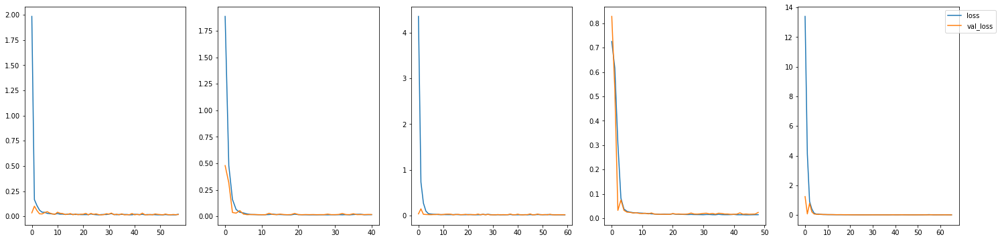

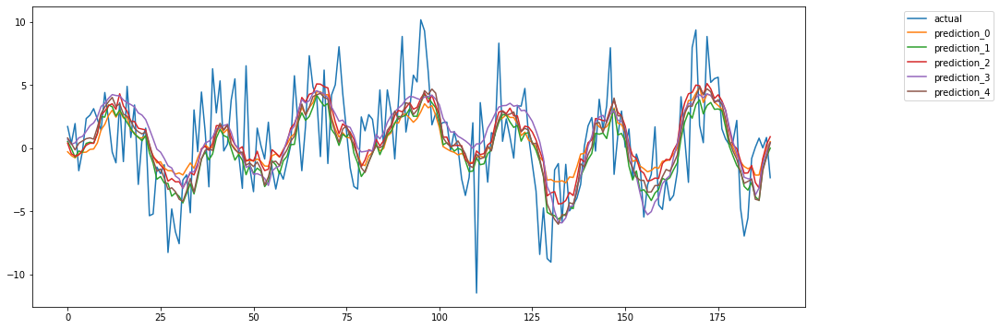

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_36 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_37 (Dropout)        (None, 7680)              0         
                                                                 
 dense_439 (Dense)           (None, 5)                 38405     
                                                                 
 dense_440 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [3.1421735420568626, 3.350085592

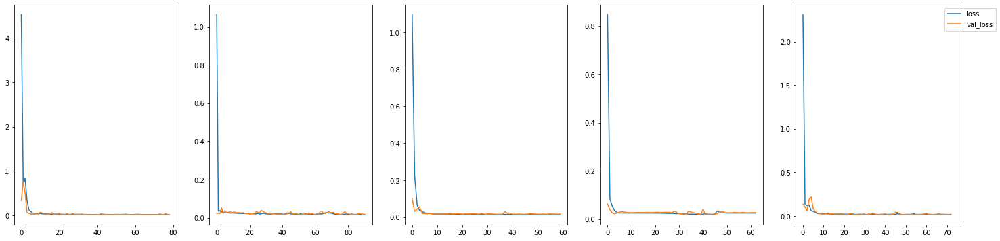

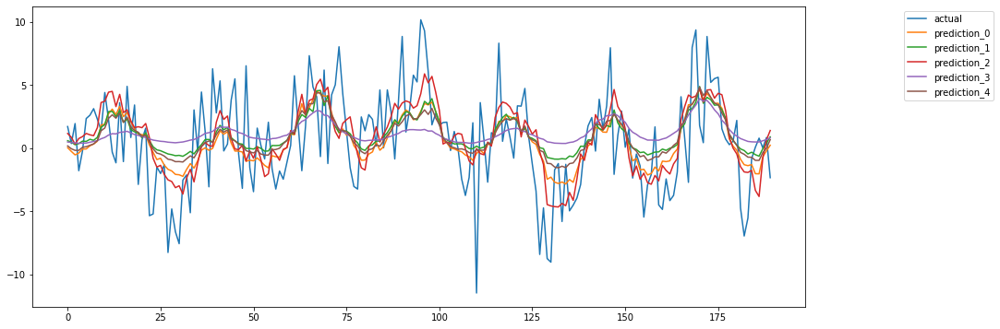

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 10, 3, 64)        0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_37 (Flatten)        (None, 384)               0         
                                                                 
 dropout_38 (Dropout)        (None, 384)               0         
                                                                 
 dense_441 (Dense)           (None, 5)                 1925      
                                               

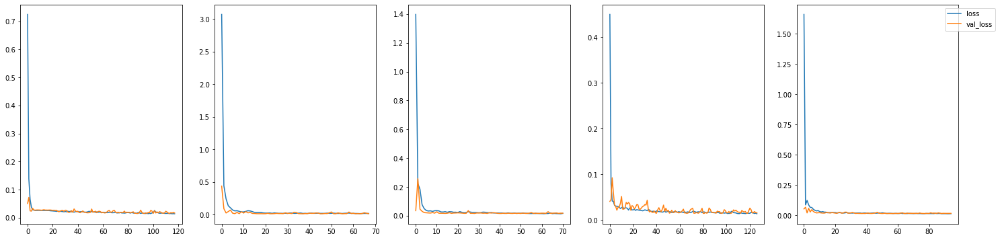

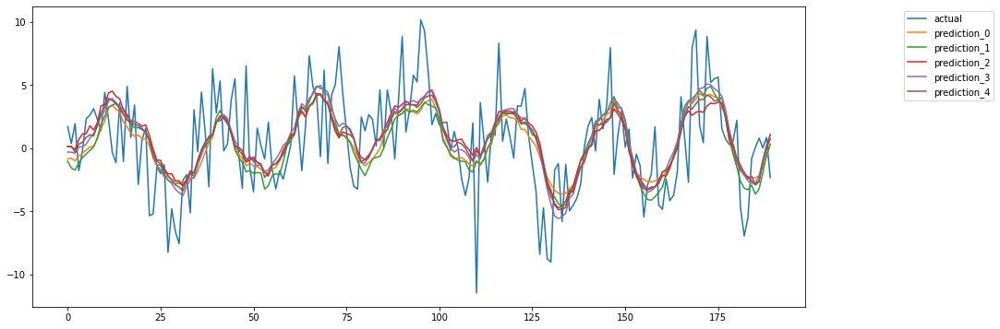

,avg,std
Simple_MLP_20_lags,3.1900167422328636,0.048285302827977473
Deep_MLP_20_lags,3.1170954759828984,0.05367678120243206
Deep_MLP_Dropout_20_lags,3.112589042896412,0.018367216444163493
RNN_20_lags,3.3168173764295488,0.04815113094755919
RNN_RNN_20_lags,3.2554283828024557,0.055318967147688934
LSTM_20_lags,3.101736550658302,0.010369430734591017
GRU_20_lags,3.191948643658554,0.03060991814137519
CNN_2D_20_lags,3.135277403943142,0.039508080889326905
Dropout_CNN_2D_20_lags,3.3079121667285762,0.17939205624061827
Deep_CNN_2D_20_lags,3.1152144274029214,0.026787214619731613


In [105]:
complex_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_series_noise3, scaler, lags)
complex_series_noise3_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
complex_series_noise3_multivariate_result_20_lags_all_models

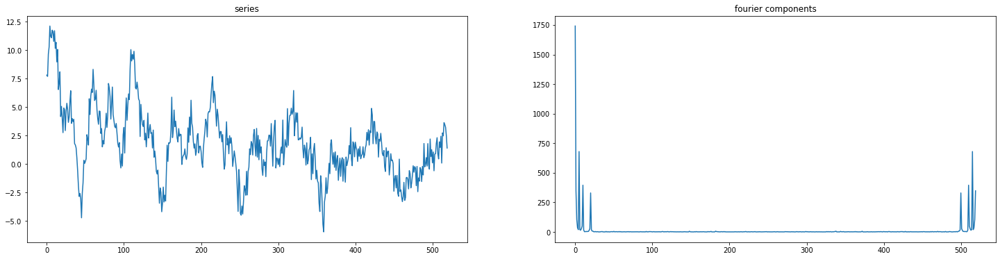

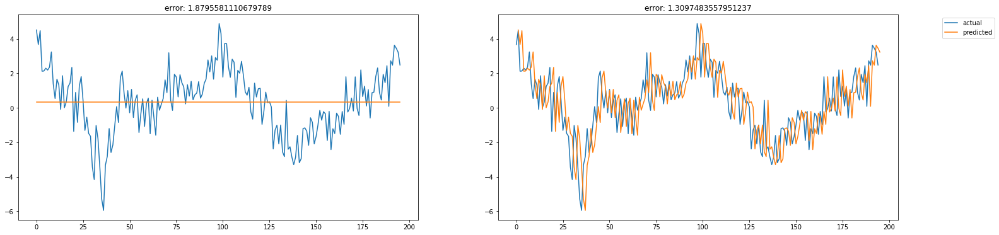

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_443 (Dense)           (None, 20)                2420      
                                                                 
 dense_444 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [1.110266924053371, 1.1284525046985254, 1.1424014610092768, 1.0949944476200748, 1.1482029813066255]
error avg: 1.1248636637375748
error std: 0.019851512476673633


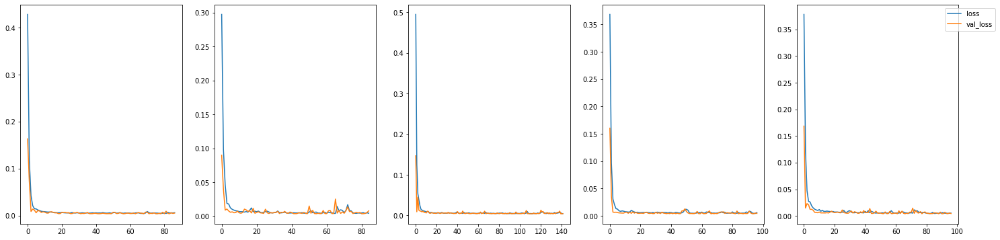

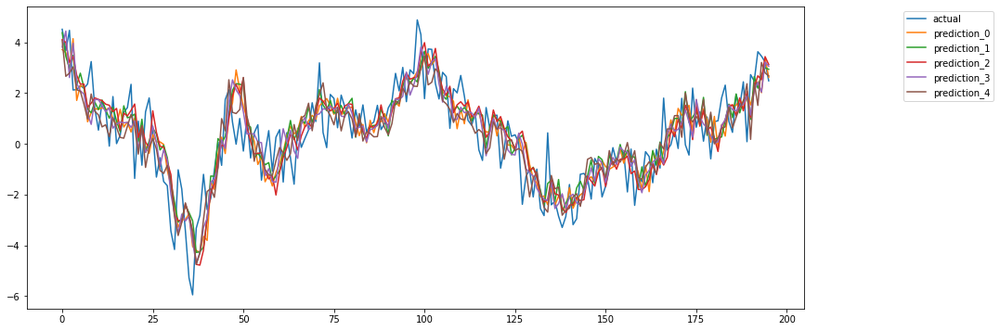

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_445 (Dense)           (None, 20)                2420      
                                                                 
 dense_446 (Dense)           (None, 100)               2100      
                                                                 
 dense_447 (Dense)           (None, 10)                1010      
                                                                 
 dense_448 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [1.1069178717130939, 1.0638091596371848, 1.098452341966287, 1.0755202381984785, 1.0970792606772597]
error avg: 1.0883557744384607
error std: 0.016061622782306457


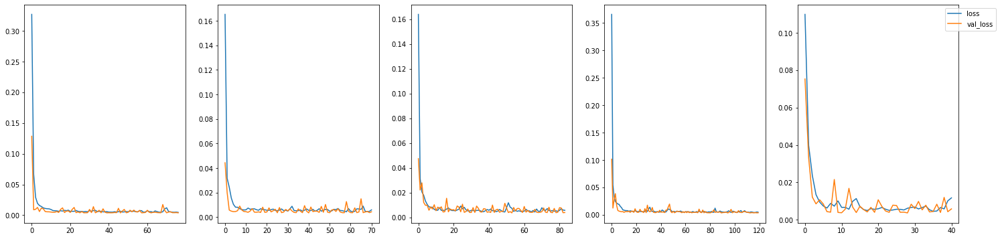

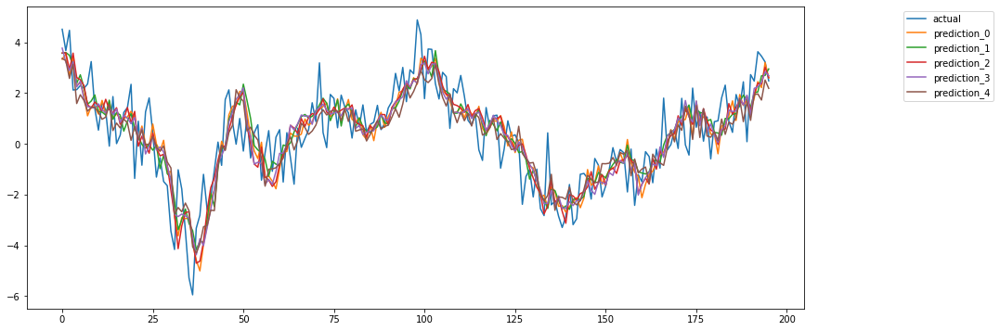

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_449 (Dense)           (None, 20)                2420      
                                                                 
 dense_450 (Dense)           (None, 100)               2100      
                                                                 
 dropout_39 (Dropout)        (None, 100)               0         
                                                                 
 dense_451 (Dense)           (None, 10)                1010      
                                                                 
 dense_452 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [1.0823332764444662, 1.099677996

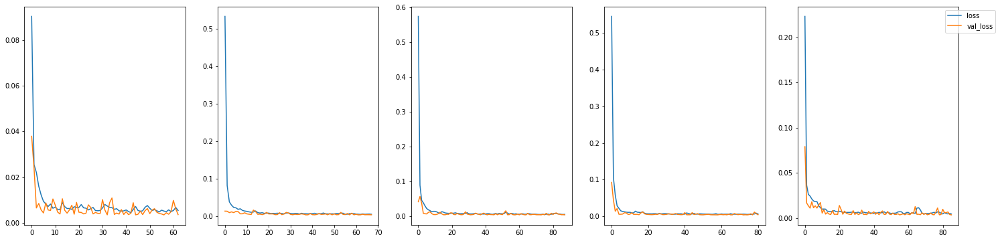

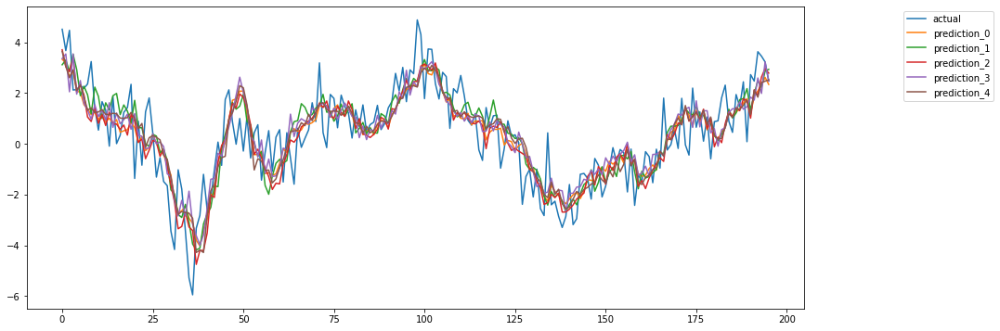

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_52 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_453 (Dense)           (None, 5)                 105       
                                                                 
 dense_454 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [1.0973993432621418, 1.111681146297695, 1.1137775140202961, 1.1590250824626962, 1.1093876667292324]
error avg: 1.1182541505544124
error std: 0.02116152674504958


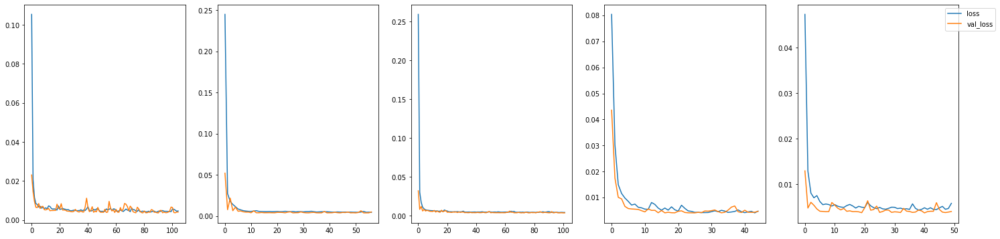

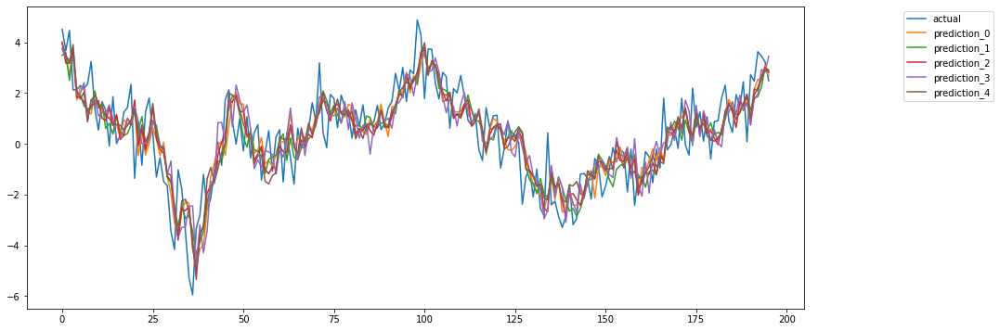

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_53 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_54 (SimpleRNN)   (None, 10)                310       
                                                                 
 dense_455 (Dense)           (None, 5)                 55        
                                                                 
 dense_456 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [1.0940842674322735, 1.1766088922131965, 1.1570009118560238, 1.1684054514482785, 1.155477215463119]
error avg: 1.1503153476825783
error std: 0.029161201524130192


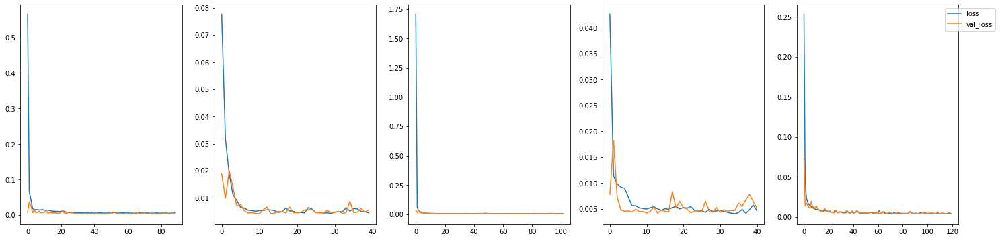

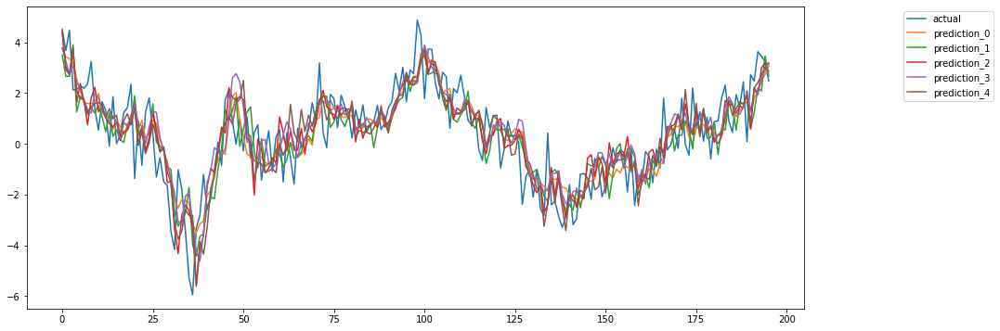

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_18 (LSTM)              (None, 20)                2160      
                                                                 
 dense_457 (Dense)           (None, 5)                 105       
                                                                 
 dense_458 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [1.0741589262235909, 1.0945862594667377, 1.10854359119007, 1.0936001410360114, 1.1103109734674308]
error avg: 1.0962399782767682
error std: 0.013012672152263573


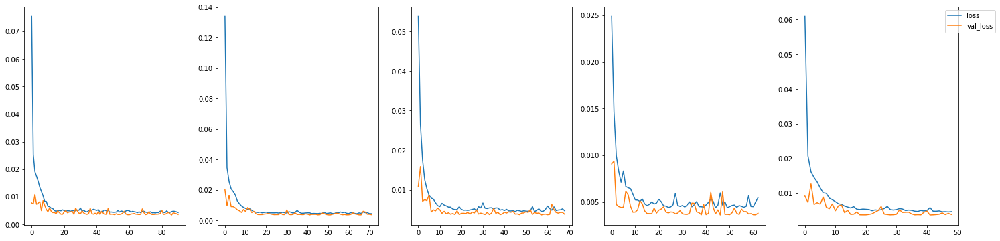

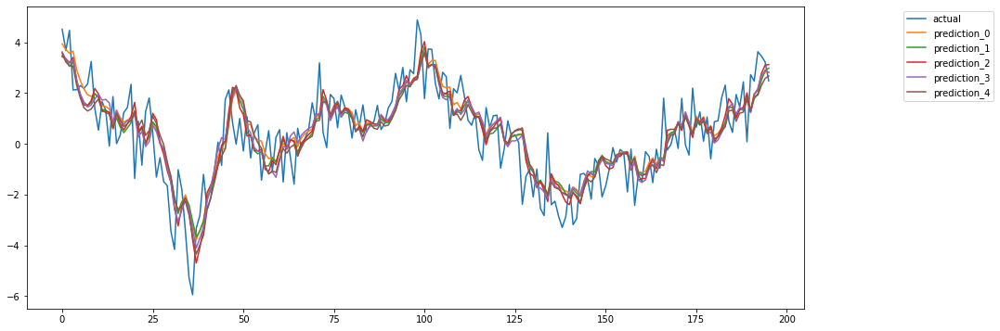

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_17 (GRU)                (None, 20)                1680      
                                                                 
 dense_459 (Dense)           (None, 5)                 105       
                                                                 
 dense_460 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [1.089503338496004, 1.136998821549339, 1.1259407788035758, 1.1351338993455073, 1.1309086895631102]
error avg: 1.1236971055515075
error std: 0.017515653683707756


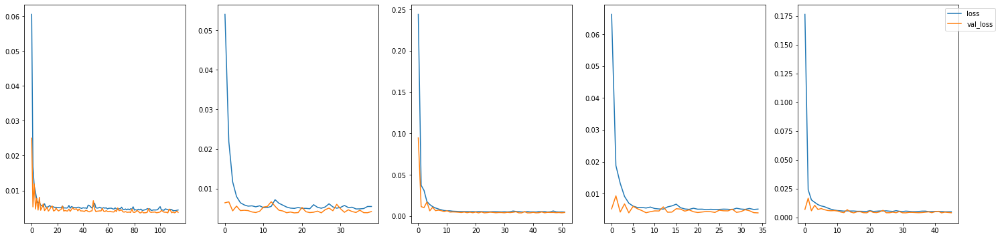

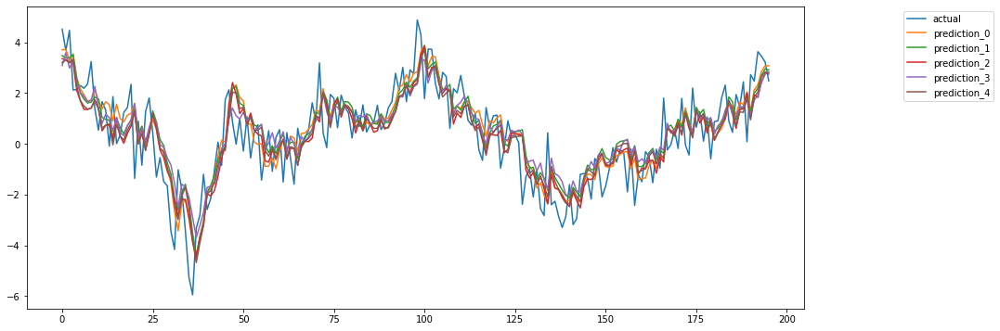

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_38 (Flatten)        (None, 7680)              0         
                                                                 
 dense_461 (Dense)           (None, 5)                 38405     
                                                                 
 dense_462 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [1.0940056838357772, 1.3005500398150902, 1.106086271277361, 1.1984113715650098, 1.092268210341353]
error avg: 1.1582643153669183
error std: 0.08131939423400301


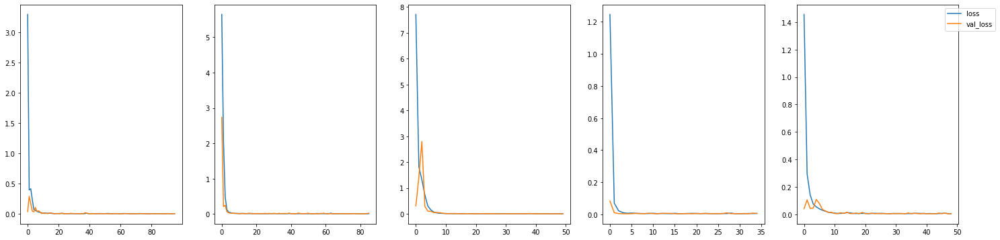

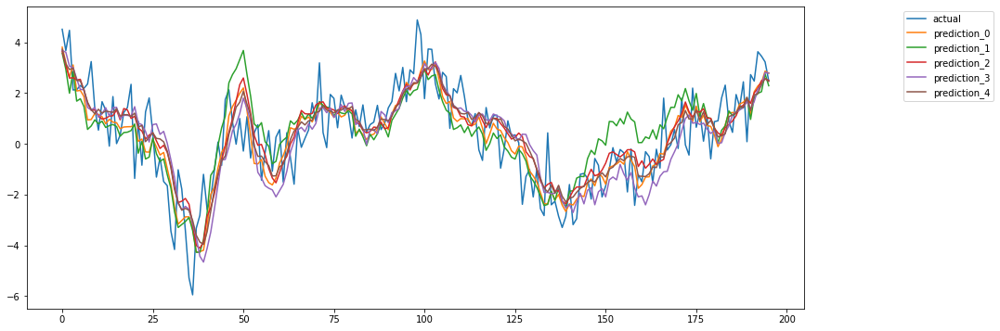

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_39 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_40 (Dropout)        (None, 7680)              0         
                                                                 
 dense_463 (Dense)           (None, 5)                 38405     
                                                                 
 dense_464 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [1.2001940652531575, 1.180822158

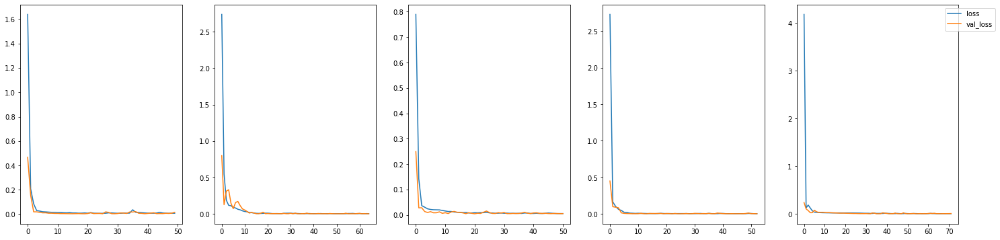

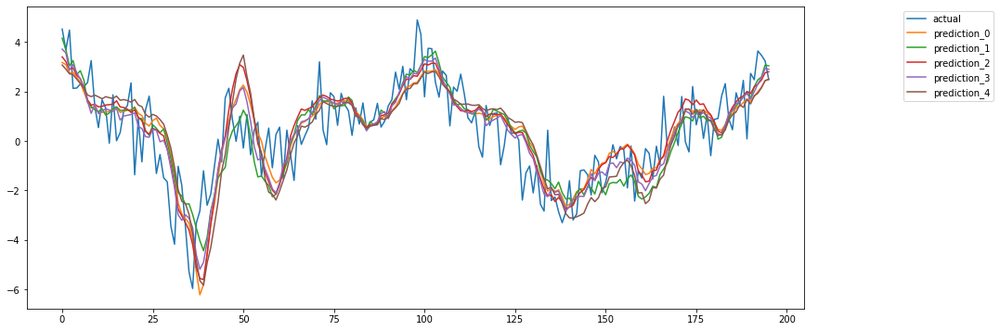

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 10, 3, 64)        0         
 2D)                                                             
                                                                 
 conv2d_23 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_40 (Flatten)        (None, 384)               0         
                                                                 
 dropout_41 (Dropout)        (None, 384)               0         
                                                                 
 dense_465 (Dense)           (None, 5)                 1925      
                                               

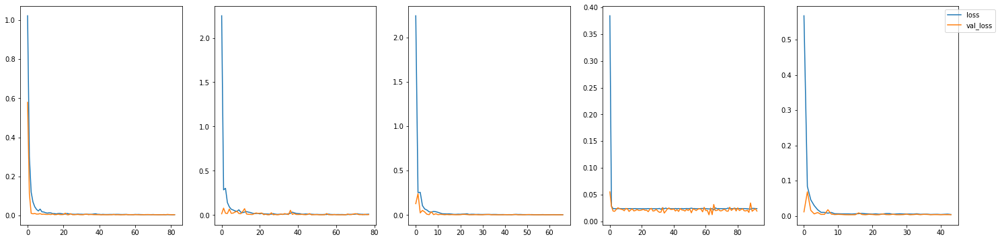

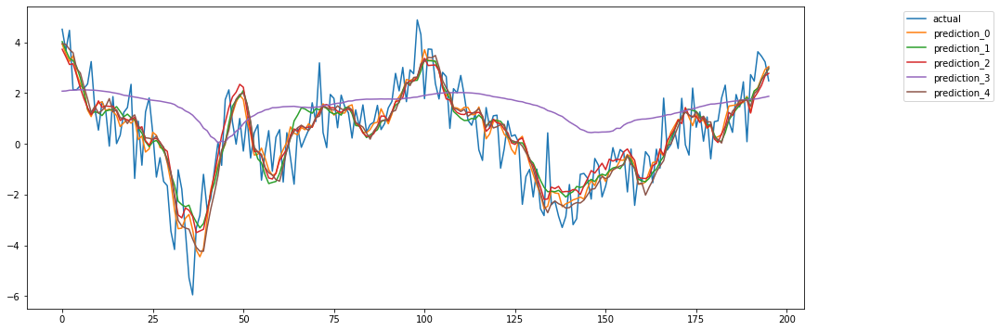

,avg,std
Simple_MLP_20_lags,1.1248636637375748,0.019851512476673633
Deep_MLP_20_lags,1.0883557744384607,0.016061622782306457
Deep_MLP_Dropout_20_lags,1.0973350469885261,0.008384173855166092
RNN_20_lags,1.1182541505544124,0.02116152674504958
RNN_RNN_20_lags,1.1503153476825783,0.029161201524130192
LSTM_20_lags,1.0962399782767682,0.013012672152263573
GRU_20_lags,1.1236971055515075,0.017515653683707756
CNN_2D_20_lags,1.1582643153669183,0.08131939423400301
Dropout_CNN_2D_20_lags,1.2163911542978032,0.07945245385025251
Deep_CNN_2D_20_lags,1.2664822057883112,0.3696383015700315


In [106]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fasing_series_noise3, scaler, lags)
complex_fasing_series_noise3_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
complex_fasing_series_noise3_multivariate_result_20_lags_all_models

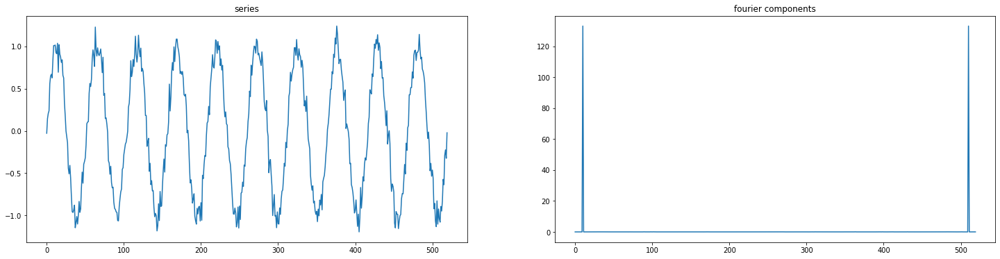

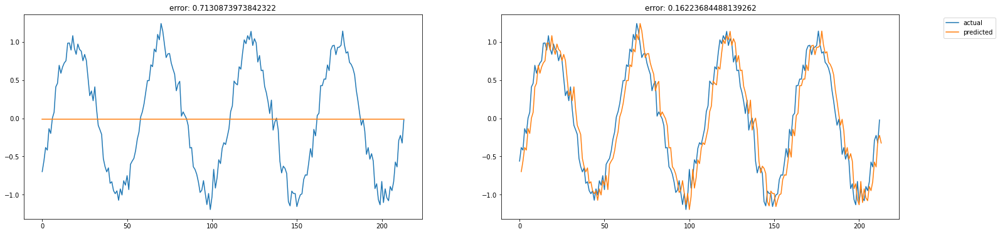

Model: "CNN_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_20 (Conv1D)          (None, 6, 64)             384       
                                                                 
 flatten_41 (Flatten)        (None, 384)               0         
                                                                 
 dense_467 (Dense)           (None, 5)                 1925      
                                                                 
 dense_468 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,315
Trainable params: 2,315
Non-trainable params: 0
_________________________________________________________________
errors: [0.12015928989583852, 0.1201953116566728, 0.11878539514691383, 0.11805842520944128, 0.11900893998063075]
error avg: 0.11924147237789944
error std: 0.0008263022116836705


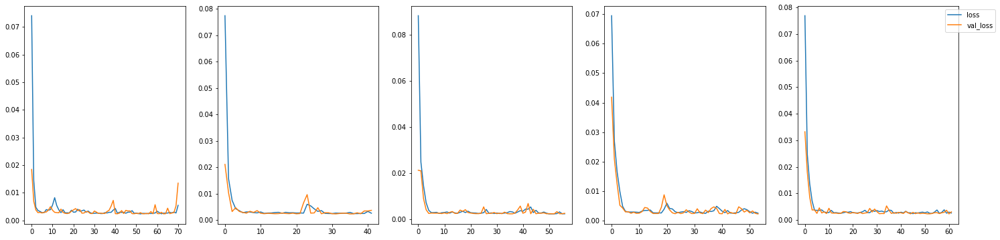

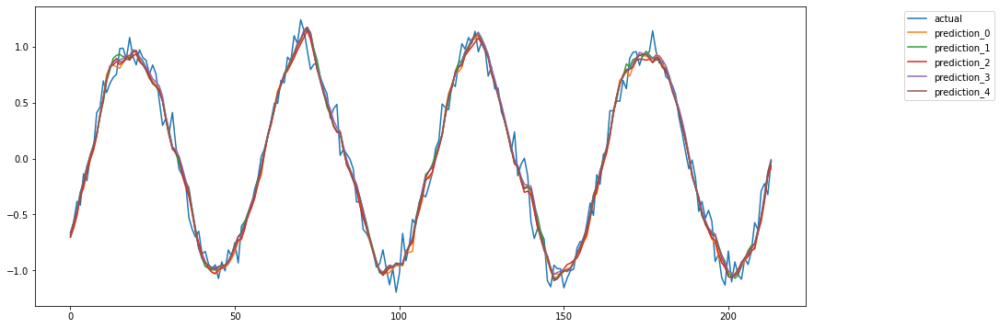

Model: "CNN_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_21 (Conv1D)          (None, 6, 64)             384       
                                                                 
 flatten_42 (Flatten)        (None, 384)               0         
                                                                 
 dense_469 (Dense)           (None, 5)                 1925      
                                                                 
 dense_470 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,315
Trainable params: 2,315
Non-trainable params: 0
_________________________________________________________________
errors: [0.12060021165526928, 0.11986099966676453, 0.11826763949963387, 0.1220672819072708, 0.11899328325031515]
error avg: 0.11995788319585073
error std: 0.00131597203612052


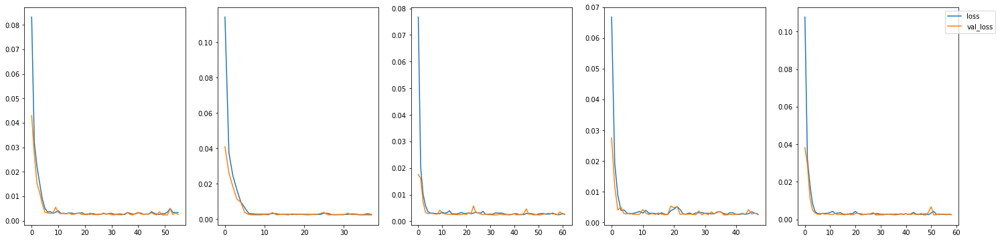

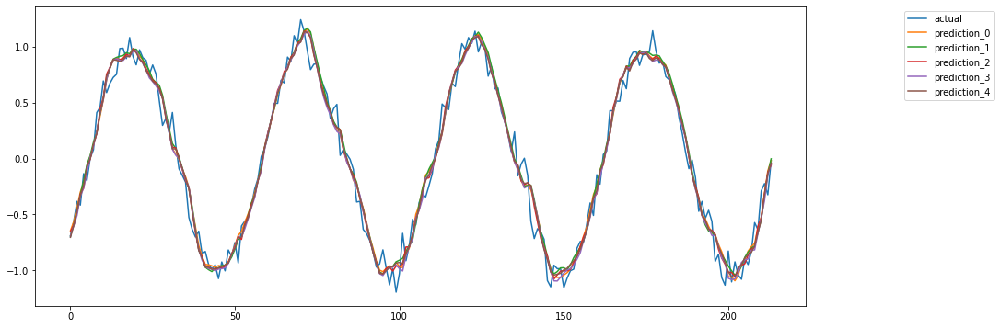

Model: "CNN_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_22 (Conv1D)          (None, 6, 64)             384       
                                                                 
 flatten_43 (Flatten)        (None, 384)               0         
                                                                 
 dense_471 (Dense)           (None, 5)                 1925      
                                                                 
 dense_472 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,315
Trainable params: 2,315
Non-trainable params: 0
_________________________________________________________________
errors: [0.12144306949878927, 0.12173029899749571, 0.12173236383652765, 0.1216587481850722, 0.12196492929300158]
error avg: 0.12170588196217728
error std: 0.00016714962443649568


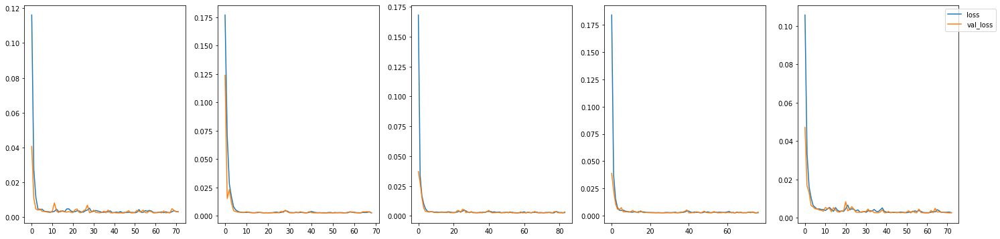

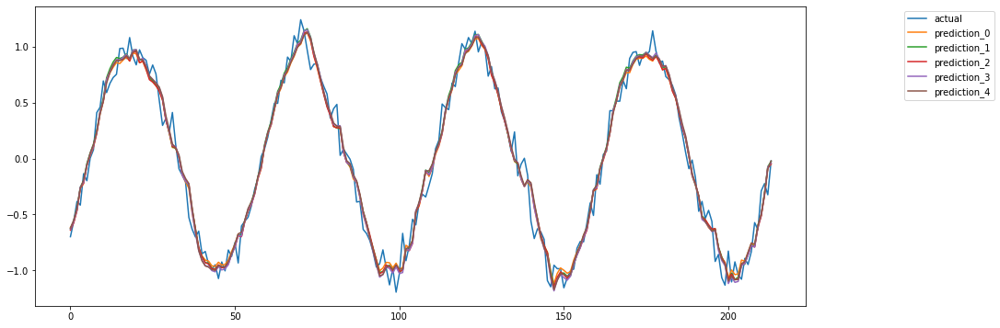

Model: "GRU_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_18 (GRU)                (None, 10)                390       
                                                                 
 dense_473 (Dense)           (None, 5)                 55        
                                                                 
 dense_474 (Dense)           (None, 1)                 6         
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________
errors: [0.12149805939276873, 0.12203479753943346, 0.1204984078209053, 0.12195397934837282, 0.12045763225493716]
error avg: 0.12128857527128349
error std: 0.0006867786765030377


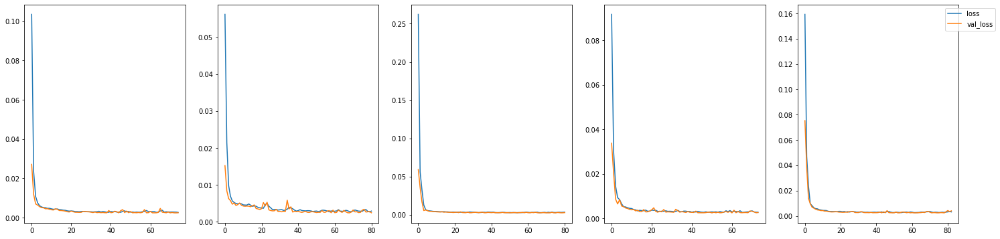

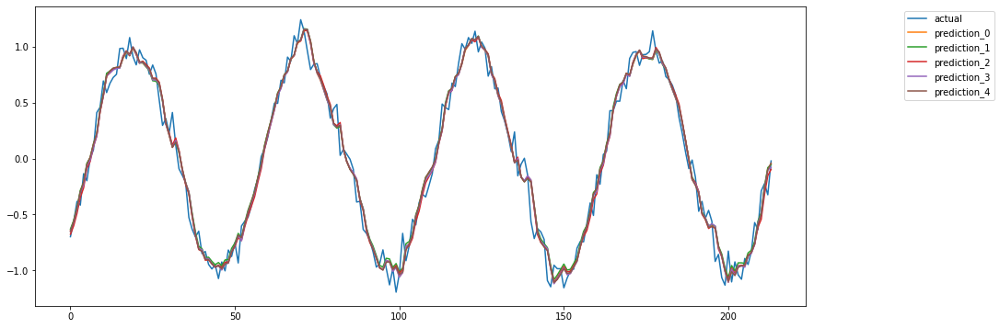

Model: "GRU_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_19 (GRU)                (None, 10)                390       
                                                                 
 dense_475 (Dense)           (None, 5)                 55        
                                                                 
 dense_476 (Dense)           (None, 1)                 6         
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________
errors: [0.12772667741781332, 0.12330457830697612, 0.12166504413163919, 0.16113030048318916, 0.1244950893013986]
error avg: 0.13166433792820328
error std: 0.014866187828858885


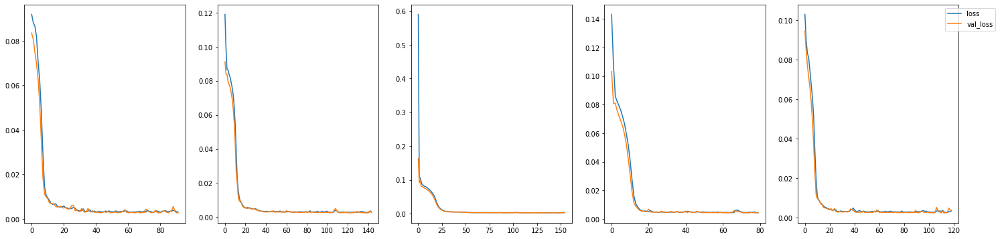

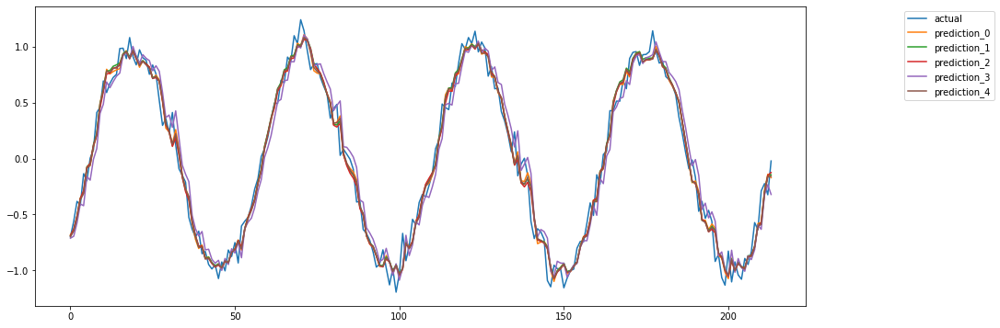

{'GRU_10_lags': ([0.12772667741781332,
   0.12330457830697612,
   0.12166504413163919,
   0.16113030048318916,
   0.1244950893013986],
  0.13166433792820328,
  0.014866187828858885)}

In [107]:
lags=10
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
evaluate_model(
    5,
    [
        layers.Conv1D(64, kernel_size=math.ceil(10.0 / 2.), activation=activations.relu),
        layers.Flatten(),
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'CNN_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.Conv1D(64, kernel_size=math.ceil(10.0 / 2.), activation=activations.relu),
        layers.Flatten(),
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'CNN_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.Conv1D(64, kernel_size=math.ceil(10.0 / 2.), activation=activations.elu),
        layers.Flatten(),
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'CNN_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.GRU(10, activation=activations.elu),
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'GRU_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.GRU(10, activation=activations.sigmoid),
        layers.Dense(5, activation=activations.sigmoid),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'GRU_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)